# Dimensional Reduction and Visualization
This notebook collects and explores the benchmark datasets and generators available in the sklearn library.  The intention of this exploration is to build intuition for the shape of high dimensional data.  The present version of this note is incomplete, and should be supplimented with questions, comments, editorial and sample code.

In [1]:
from time import time
import os
import random
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib as mpl
import matplotlib.pyplot as plt

import seaborn as sns
rc={'lines.linewidth': 2, 'axes.labelsize': 14, 'axes.titlesize': 14}
sns.set(rc=rc)

from sklearn.utils import check_random_state

%matplotlib inline
plt.style.use('seaborn-white')

## Table of Contents

**[Datasets](#Datasets)**
-  [Pixel Arrays](#Pixel-Arrays)
-  [Cannonical Sets](#Cannonical-Sets)
-  [360°-Objects](#360°-Objects)

**[Data Augmentation](#Data-Augmentation)**
-  [Gaussian Noise](#Gaussian-Noise)
-  [Symmetry Transform](#Symmetry-Transform)

**[Data Generators](#Data-Generators)**  
-  [SciKit Learn Generators](#SciKit-Learn-Generators)
-  [Parametric Generators](#Parametric-Generators)
-  [Prime Factors](#Prime-Factors)

**[Dimensional Reduction](#Dimensional-Reduction)**
-  [Linear Methods](#Linear-Methods)
-  [Linear Probabalistic Methods](#Linear-Probabalistic-Methods)
-  [Manifold Learning Methods](#Manifold-Learning-Methods)
-  [Representation Learning Methods](#Deep-Representation-Learning)

**[Point Cloud Structure](#Point-Cloud-Structure)**
-  [Local Structure](#Local-Structure)
-  [Global Structure](#Global-Structure)

**[Performance Metrics](#Performance-Metrics)**

**[UMAP Parameters](#UMAP-Parameters)**
-  [n_neighbors](#n_neighbors)
-  [min_dist](#min_dist)
-  [n_components](#n_components)
-  [metric](#metric)

**[UMAP Applications](#UMAP-Applications)**
-  [dimensional reduction](#dimensional-reduction)
-  [pre processing](#pre-processing)
-  [metric learning](#metric-learning)

**[UMAP Visualizations](#UMAP-Visualizations)**

**[Algorithm Comparison](#Algorithm-Comparison)**

**[Method Comparison Code](#Method-Comparison-Code)**

## Datasets
These are the [benchmark](http://scikit-learn.org/stable/datasets/index.html#datasets) datasets provided in [sklearn](http://scikit-learn.org/stable/modules/classes.html#module-sklearn.datasets) machine learning API.

**[Pixel Arrays](#Pixel-Arrays)**
-  [Handwritten Digits](#Handwritten-Digits)
-  [MNIST](#MNIST)
-  [Fashion MNIST](#Fashion-MNIST)

**[Cannonical Sets](#Cannonical-Sets)**
-  [Iris](#Iris)
-  [Wine](#Wine)

**[Panoramas](#Panoramas)**
-  [SUN360](#SUN360)

**[360°-Objects](#360°-Objects)**
-  [COIL-20](#COIL-20)
-  [COIL-100](#COIL-100)

Back to [Table of Contents](#Table-of-Contents).

In [2]:
from sklearn import datasets as ds

### Pixel Arrays

#### Handwritten Digits
This seems to be a downsampled version of MNIST with local averaging (4x4 -> 1x1).

In [3]:
digits = ds.load_digits()
print(digits.data.shape)

(1797, 64)


<Figure size 432x288 with 0 Axes>

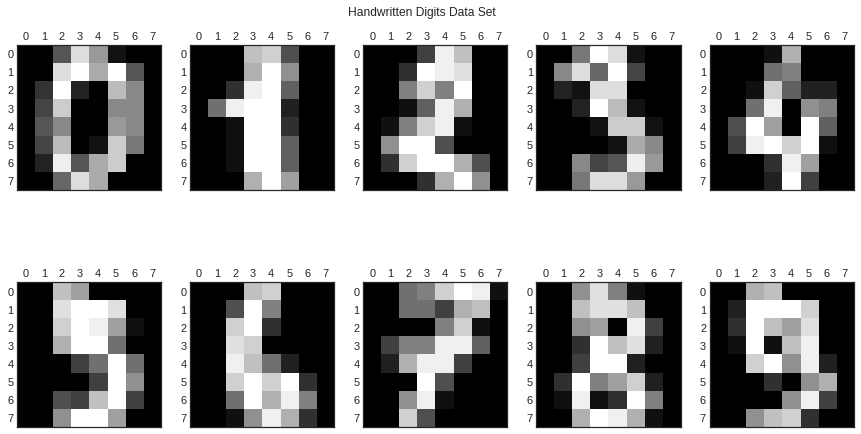

In [4]:
plt.gray()

fig = plt.figure(figsize=(15, 8))
plt.suptitle("Handwritten Digits Data Set", y=0.9)
for i in range(10):
    ax = fig.add_subplot(2, 5, 1+i)
    ax.matshow(digits.images[i]) 
    ax.grid(False)
plt.show() 

#### MNIST

In [5]:
(mnist_train, mnist_label_train), (mnist_test, mnist_label_test)  = tf.keras.datasets.mnist.load_data()
print(mnist_train.shape)
print(mnist_test.shape)
print(mnist_label_train.shape)
print(mnist_label_train.shape)

(60000, 28, 28)
(10000, 28, 28)
(60000,)
(60000,)


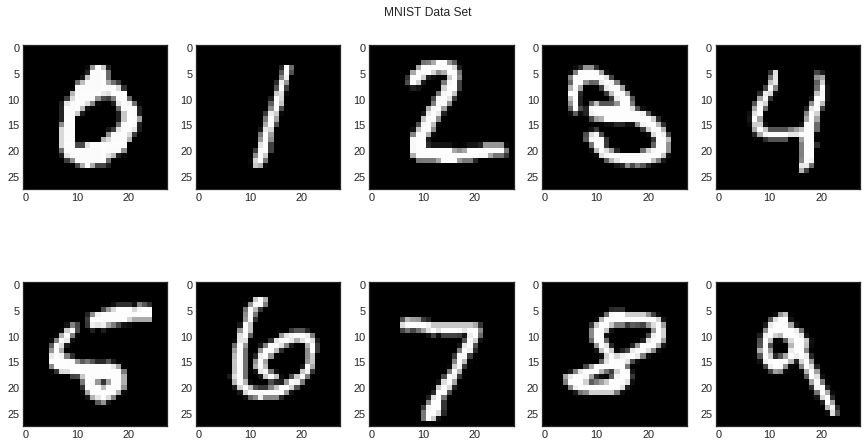

In [6]:
plt.figure(figsize=(15,8))
plt.suptitle("MNIST Data Set", y=0.9)
for i in range(10):
    ax = plt.subplot(2,5, 1+i)
    ax.grid(False)
    ix = np.where(mnist_label_test==i)[0][0]
    plt.imshow(mnist_test[ix].reshape(28,28))
    plt.gray()
plt.show()

#### Fashion MNIST

In [7]:
(fashion_mnist_train, fashion_mnist_label_train), (fashion_mnist_test, fashion_mnist_label_test)  = tf.keras.datasets.fashion_mnist.load_data()
print(fashion_mnist_train.shape)
print(fashion_mnist_test.shape)
print(fashion_mnist_label_train.shape)
print(fashion_mnist_label_train.shape)

(60000, 28, 28)
(10000, 28, 28)
(60000,)
(60000,)


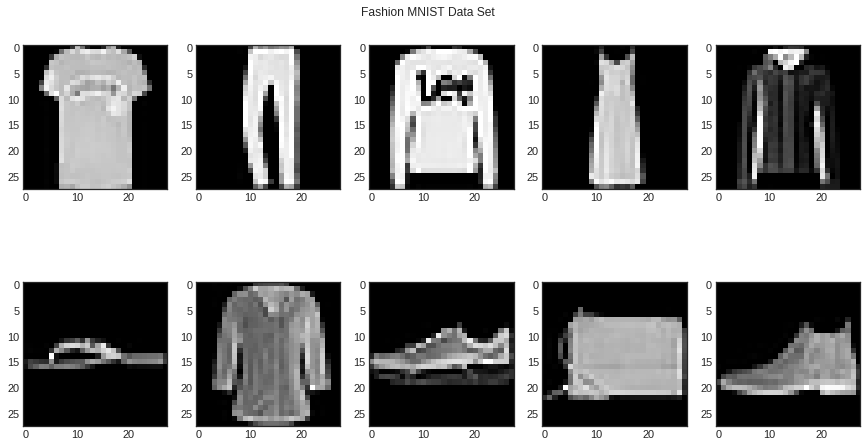

In [8]:
plt.figure(figsize=(15,8))
plt.suptitle("Fashion MNIST Data Set", y=0.9)
for i in range(10):
    ax = plt.subplot(2,5, 1+i)
    ix = np.where(fashion_mnist_label_test==i)[0][0]
    plt.imshow(fashion_mnist_test[ix].reshape(28,28))
    ax.grid(False)
    plt.gray()
plt.show()

### Cannonical Sets

#### Iris

In [9]:
iris = ds.load_iris()
print(iris.data.shape)

(150, 4)


In [10]:
# Make a DataFrame with a species column
df_iris = pd.DataFrame(iris.data, columns=iris.feature_names)
df_iris['species'] = iris.target_names[iris.target]
# Take a look at df_iris
df_iris.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


/home/ian/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


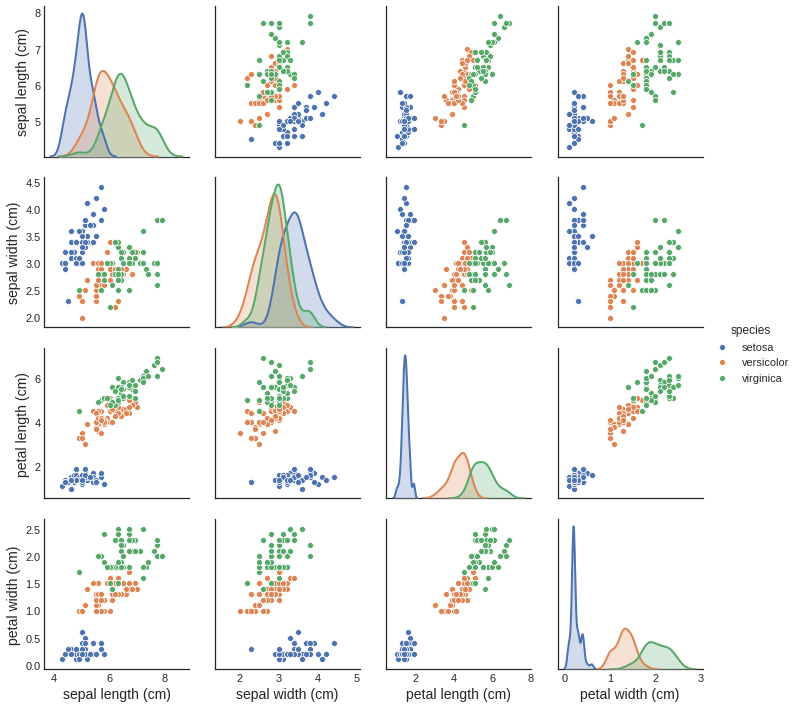

In [11]:
# Plot pairwise comparison to explore the data
_ = sns.pairplot(df_iris, hue='species')

#### Wine

In [12]:
wine = ds.load_wine()
print(wine.data.shape)

(178, 13)


In [13]:
pd.DataFrame(wine.data).head()
# Make a DataFrame with a species column
df_wine = pd.DataFrame(wine.data, columns=wine.feature_names)
df_wine['class'] = wine.target_names[wine.target]
# Take a look at df_iris
df_wine.head()

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline,class
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0,class_0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0,class_0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0,class_0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0,class_0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0,class_0


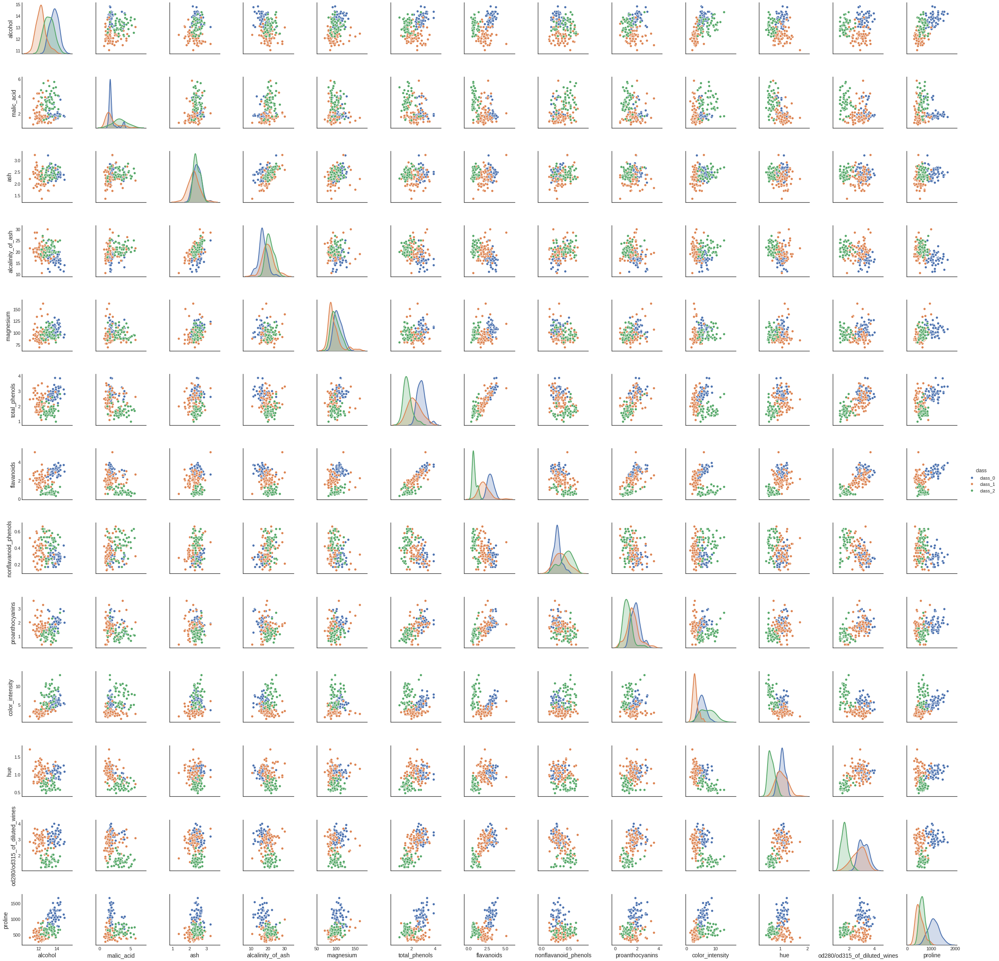

In [14]:
# Plot pairwise comparison to explore the data
_ = sns.pairplot(df_wine, hue='class')

### Panoramas

#### SUN360 
This is a dataset of [panorama images](http://people.csail.mit.edu/jxiao/SUN360/), and contains natural feature space cycles.  The maintainence of these cycles after dimensional reduction provide us with a crude [topological fidelity](http://math.uchicago.edu/~shmuel/AAT-readings/Data%20Analysis%20/mumford-carlsson%20et%20al.pdf) index.

### 360&deg; Objects

#### COIL-20
Dataset from the Columbia Object Image Library, which contains 360% rotation camera angles about [20 objects](http://www.cs.columbia.edu/CAVE/software/softlib/coil-20.php).

In [15]:
from PIL import Image

path="/home/ian/Workspace/Visualization Notebooks/coil-20-proc/"
Xlist=[]
Ylist=[]
for file in os.listdir(path):
    print(path+file)
    img=Image.open(path+file)
    featurevector=np.array(img).flatten()#[:50] #in my case the images dont have the same dimensions, so [:50] only takes the first 50 values
    Xlist.append(featurevector)
    Ylist.append(file.split('_')[0])
print("Loaded %d images from the COIL-20 dataset." %len(Xlist))

/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj1__43.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj6__36.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj2__67.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj4__37.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj7__17.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj12__21.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj8__21.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj8__5.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj20__61.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj3__6.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj11__28.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj17__25.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj1__48.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj16__13.png
/home/ian/Workspa

/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj7__25.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj4__12.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj15__54.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj10__36.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj9__13.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj11__51.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj18__63.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj5__62.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj11__14.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj11__54.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj11__15.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj11__46.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj20__9.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj12__58.png
/home/ian/W

/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj17__52.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj6__28.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj14__27.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj9__68.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj13__53.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj10__41.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj2__16.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj7__28.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj2__29.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj14__62.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj17__34.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj13__62.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj15__71.png
/home/ian/Workspace/Visualization Notebooks/coil-20-proc/obj16__8.png
/home/ian/Wo

In [16]:
print(type(Xlist[0]))
print(Xlist[0].shape)

<class 'numpy.ndarray'>
(16384,)


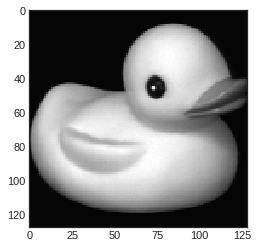

In [17]:
plt.imshow(Xlist[0].reshape(128, 128))

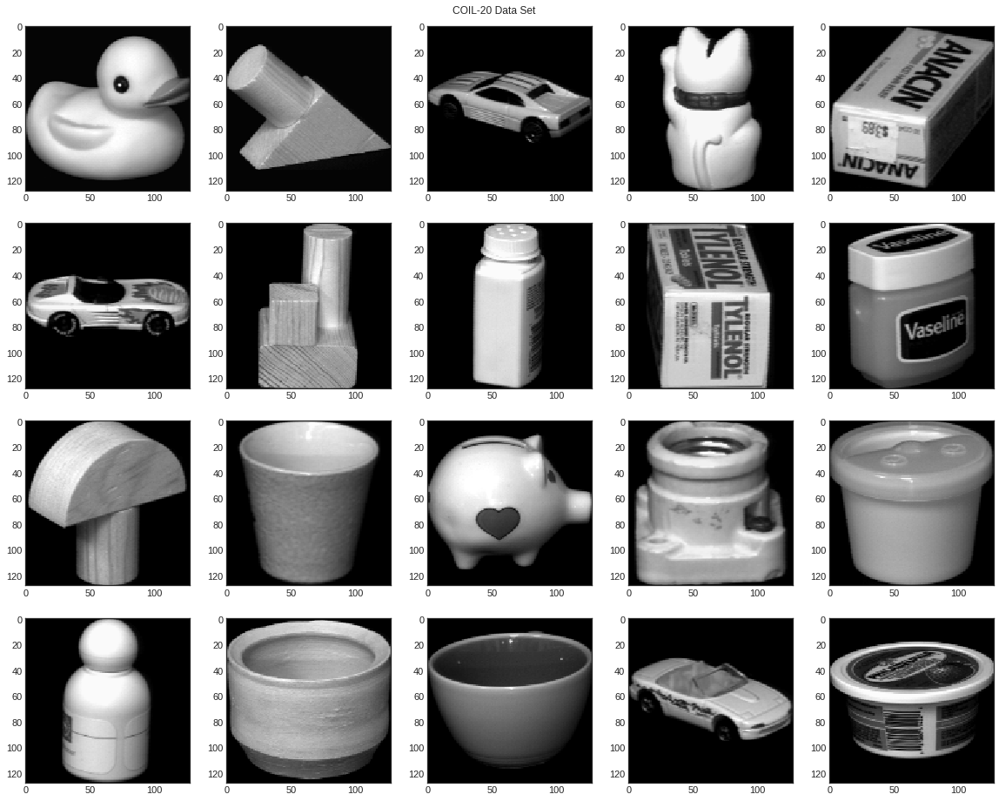

In [18]:
plt.figure(figsize=(20,16))
plt.suptitle("COIL-20 Data Set", y=0.9)
for i in range(1,21):
    ax = plt.subplot(4,5, i)
    ix = Ylist.index('obj%d'%i)
    plt.imshow(Xlist[ix].reshape(128,128))
    ax.grid(False)
    plt.gray()
plt.show()

#### COIL-100
Dataset from the Columbia Object Image Library, which contains 360% rotation camera angles about [100 objects](http://www1.cs.columbia.edu/CAVE/software/softlib/coil-100.php).

In [19]:
from PIL import Image

path="/home/ian/Workspace/Visualization Notebooks/coil-100/"
XCOIL=[]
YCOIL=[]
for file in os.listdir(path):
    if file.split('.')[-1] == 'png':
        print(path+file)
        img=Image.open(path+file)
        featurevector=np.array(img).flatten()#[:50] #in my case the images dont have the same dimensions, so [:50] only takes the first 50 values
        XCOIL.append(featurevector)
        YCOIL.append(file.split('_')[0])
print("Loaded %d images from the COIL-100 dataset." %len(XCOIL))

/home/ian/Workspace/Visualization Notebooks/coil-100/obj55__315.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj30__280.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj15__260.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj24__325.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj95__175.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj30__225.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj50__345.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj62__220.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj72__15.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj15__185.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj77__315.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj35__5.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj7__315.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj57__350.png
/home/ian/Workspace/Visualization Notebooks/coil-100

/home/ian/Workspace/Visualization Notebooks/coil-100/obj58__210.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj12__235.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj32__60.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj16__190.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj71__285.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj29__310.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj67__285.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj8__75.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj66__65.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj27__285.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj28__250.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj77__210.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj87__330.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj10__235.png
/home/ian/Workspace/Visualization Notebooks/coil-100

/home/ian/Workspace/Visualization Notebooks/coil-100/obj3__30.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj22__50.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj67__85.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj64__5.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj34__265.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj97__255.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj34__355.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj34__70.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj11__280.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj30__145.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj16__245.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj89__105.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj19__245.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj55__270.png
/home/ian/Workspace/Visualization Notebooks/coil-100/ob

/home/ian/Workspace/Visualization Notebooks/coil-100/obj29__200.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj68__190.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj41__30.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj40__125.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj74__295.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj41__115.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj10__190.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj13__205.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj60__310.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj62__170.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj29__50.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj30__40.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj69__355.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj27__230.png
/home/ian/Workspace/Visualization Notebooks/coil-10

/home/ian/Workspace/Visualization Notebooks/coil-100/obj88__275.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj40__225.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj52__95.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj41__220.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj12__260.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj19__340.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj90__60.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj27__200.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj50__320.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj44__140.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj72__275.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj30__75.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj45__105.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj40__0.png
/home/ian/Workspace/Visualization Notebooks/coil-100/

/home/ian/Workspace/Visualization Notebooks/coil-100/obj26__220.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj15__50.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj42__220.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj79__195.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj7__90.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj50__95.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj15__90.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj34__305.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj98__145.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj81__325.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj3__85.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj71__165.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj68__45.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj95__50.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj5

/home/ian/Workspace/Visualization Notebooks/coil-100/obj20__70.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj26__180.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj83__100.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj43__355.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj86__135.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj5__265.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj5__220.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj99__120.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj80__165.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj11__155.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj61__200.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj61__250.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj97__110.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj79__110.png
/home/ian/Workspace/Visualization Notebooks/coil-10

/home/ian/Workspace/Visualization Notebooks/coil-100/obj91__190.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj8__50.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj90__200.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj2__45.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj68__70.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj69__120.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj55__85.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj96__355.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj39__80.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj34__185.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj67__145.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj53__345.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj76__260.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj81__140.png
/home/ian/Workspace/Visualization Notebooks/coil-100/ob

/home/ian/Workspace/Visualization Notebooks/coil-100/obj82__265.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj48__20.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj76__240.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj39__215.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj50__295.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj85__60.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj88__70.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj42__115.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj39__60.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj39__240.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj54__250.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj34__200.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj7__110.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj49__340.png
/home/ian/Workspace/Visualization Notebooks/coil-100/

/home/ian/Workspace/Visualization Notebooks/coil-100/obj36__145.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj92__240.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj7__45.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj55__25.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj67__120.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj81__225.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj5__285.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj56__55.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj66__255.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj36__125.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj83__230.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj33__60.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj73__25.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj53__260.png
/home/ian/Workspace/Visualization Notebooks/coil-100/ob

/home/ian/Workspace/Visualization Notebooks/coil-100/obj30__120.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj1__190.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj94__85.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj67__70.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj43__55.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj81__160.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj55__10.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj69__260.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj19__185.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj46__280.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj98__75.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj69__255.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj64__230.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj54__240.png
/home/ian/Workspace/Visualization Notebooks/coil-100/o

/home/ian/Workspace/Visualization Notebooks/coil-100/obj24__50.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj28__30.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj92__225.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj72__190.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj74__25.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj12__170.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj48__250.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj36__25.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj15__280.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj5__0.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj91__25.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj14__215.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj16__50.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj90__30.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj47

/home/ian/Workspace/Visualization Notebooks/coil-100/obj77__35.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj13__185.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj75__280.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj81__260.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj81__135.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj17__270.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj6__355.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj92__95.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj56__210.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj54__355.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj10__45.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj65__125.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj75__325.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj34__145.png
/home/ian/Workspace/Visualization Notebooks/coil-100

/home/ian/Workspace/Visualization Notebooks/coil-100/obj62__85.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj10__215.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj77__235.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj35__195.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj79__350.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj74__320.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj17__300.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj39__310.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj49__50.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj88__265.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj29__170.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj32__255.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj77__275.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj42__20.png
/home/ian/Workspace/Visualization Notebooks/coil-10

/home/ian/Workspace/Visualization Notebooks/coil-100/obj100__45.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj100__35.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj30__310.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj69__130.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj11__30.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj31__345.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj88__190.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj19__275.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj82__110.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj88__165.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj69__225.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj55__300.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj63__325.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj64__170.png
/home/ian/Workspace/Visualization Notebooks/coil-

/home/ian/Workspace/Visualization Notebooks/coil-100/obj40__10.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj65__355.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj73__65.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj22__115.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj44__355.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj42__100.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj12__230.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj19__90.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj76__210.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj16__70.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj1__235.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj63__55.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj70__160.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj30__90.png
/home/ian/Workspace/Visualization Notebooks/coil-100/ob

/home/ian/Workspace/Visualization Notebooks/coil-100/obj5__80.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj41__150.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj19__295.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj12__310.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj82__140.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj37__175.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj20__190.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj60__110.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj31__130.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj17__230.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj9__0.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj35__130.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj45__185.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj34__325.png
/home/ian/Workspace/Visualization Notebooks/coil-100/

/home/ian/Workspace/Visualization Notebooks/coil-100/obj32__155.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj40__340.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj60__240.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj59__290.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj27__120.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj77__350.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj61__190.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj30__45.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj43__10.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj66__195.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj98__175.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj89__200.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj53__150.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj93__80.png
/home/ian/Workspace/Visualization Notebooks/coil-10

/home/ian/Workspace/Visualization Notebooks/coil-100/obj100__95.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj34__270.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj81__345.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj78__270.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj65__300.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj85__245.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj41__320.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj100__310.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj97__265.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj95__195.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj28__190.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj8__195.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj73__220.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj47__190.png
/home/ian/Workspace/Visualization Notebooks/coil

/home/ian/Workspace/Visualization Notebooks/coil-100/obj19__105.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj51__45.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj51__125.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj71__95.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj68__305.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj52__150.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj20__310.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj41__240.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj90__220.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj99__160.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj54__100.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj96__165.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj35__150.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj14__270.png
/home/ian/Workspace/Visualization Notebooks/coil-1

/home/ian/Workspace/Visualization Notebooks/coil-100/obj20__0.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj78__45.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj29__60.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj85__235.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj55__0.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj3__305.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj68__145.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj52__280.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj92__140.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj18__20.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj76__175.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj84__100.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj76__325.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj4__300.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj4

/home/ian/Workspace/Visualization Notebooks/coil-100/obj70__355.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj72__270.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj14__125.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj12__315.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj99__320.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj76__120.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj54__230.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj70__140.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj82__115.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj68__5.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj74__130.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj63__60.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj63__65.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj88__260.png
/home/ian/Workspace/Visualization Notebooks/coil-100

/home/ian/Workspace/Visualization Notebooks/coil-100/obj51__340.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj32__335.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj88__305.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj6__330.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj50__190.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj63__110.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj73__70.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj2__310.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj96__100.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj66__20.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj77__20.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj49__305.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj44__0.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj15__250.png
/home/ian/Workspace/Visualization Notebooks/coil-100/ob

/home/ian/Workspace/Visualization Notebooks/coil-100/obj44__220.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj68__270.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj77__245.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj89__180.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj38__25.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj54__300.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj97__15.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj90__45.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj30__125.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj86__40.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj6__345.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj84__340.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj85__90.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj2__195.png
/home/ian/Workspace/Visualization Notebooks/coil-100/ob

/home/ian/Workspace/Visualization Notebooks/coil-100/obj21__145.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj74__95.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj28__310.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj3__240.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj46__220.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj55__90.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj37__180.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj36__50.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj70__55.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj79__215.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj33__330.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj22__210.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj2__175.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj33__30.png
/home/ian/Workspace/Visualization Notebooks/coil-100/ob

/home/ian/Workspace/Visualization Notebooks/coil-100/obj65__165.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj33__40.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj8__220.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj21__5.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj89__215.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj51__5.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj12__240.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj23__250.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj39__160.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj20__270.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj38__105.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj91__110.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj46__130.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj96__235.png
/home/ian/Workspace/Visualization Notebooks/coil-100/o

/home/ian/Workspace/Visualization Notebooks/coil-100/obj77__120.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj11__130.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj73__350.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj75__210.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj29__115.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj39__25.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj59__200.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj87__225.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj98__250.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj100__115.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj58__350.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj37__135.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj33__270.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj28__5.png
/home/ian/Workspace/Visualization Notebooks/coil-1

/home/ian/Workspace/Visualization Notebooks/coil-100/obj65__100.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj24__225.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj91__330.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj9__245.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj23__300.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj5__35.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj71__125.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj94__210.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj18__75.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj58__100.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj33__100.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj35__40.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj14__90.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj96__205.png
/home/ian/Workspace/Visualization Notebooks/coil-100/o

/home/ian/Workspace/Visualization Notebooks/coil-100/obj89__170.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj51__165.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj27__95.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj47__285.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj19__315.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj19__330.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj23__195.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj5__310.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj83__165.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj67__15.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj53__165.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj37__85.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj5__270.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj30__325.png
/home/ian/Workspace/Visualization Notebooks/coil-100/

/home/ian/Workspace/Visualization Notebooks/coil-100/obj36__195.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj15__210.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj82__250.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj66__105.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj63__30.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj48__235.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj46__25.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj73__100.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj28__345.png
/home/ian/Workspace/Visualization Notebooks/coil-100/obj100__325.png
Loaded 7200 images from the COIL-100 dataset.


In [20]:
print(type(XCOIL[0]))
print(XCOIL[0].shape)

<class 'numpy.ndarray'>
(49152,)


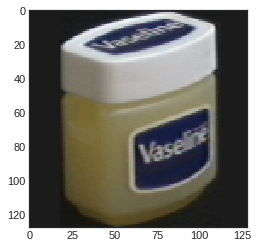

In [21]:
plt.imshow(XCOIL[0].reshape(128, 128, 3))

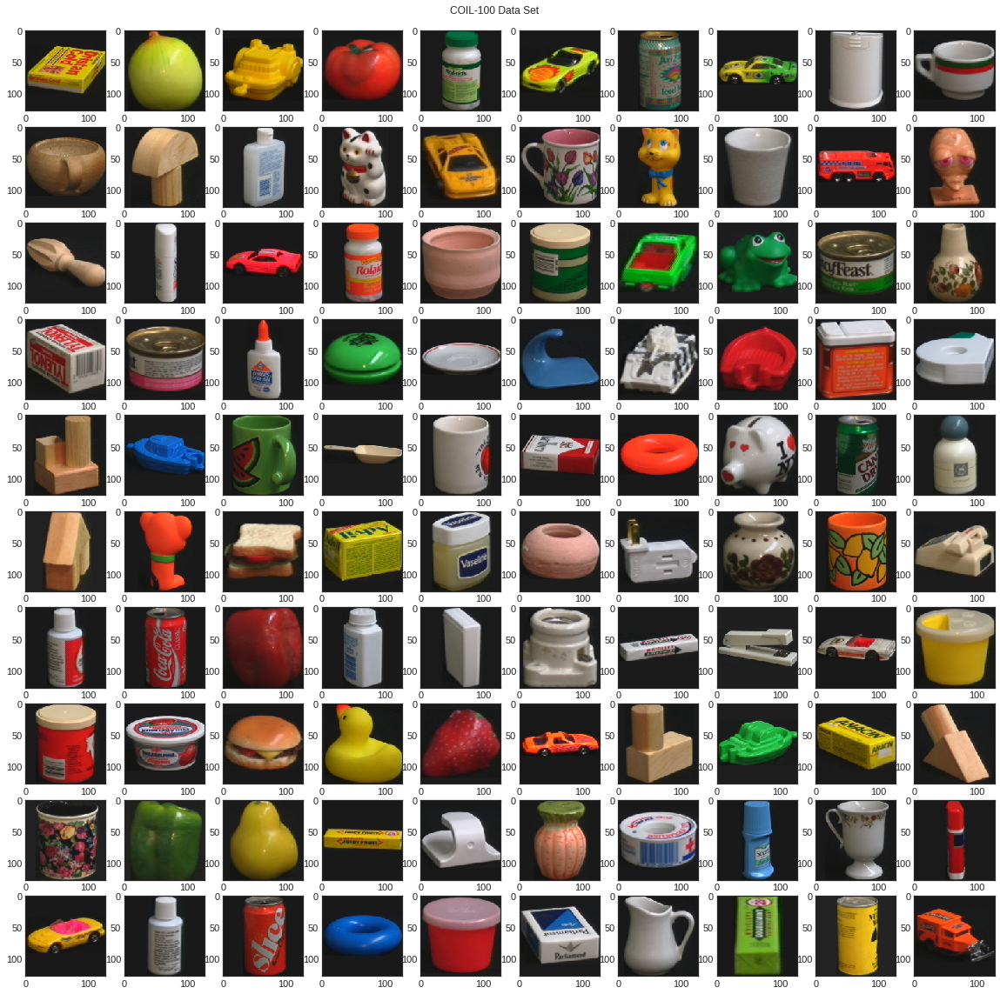

In [22]:
plt.figure(figsize=(20,20))
plt.suptitle("COIL-100 Data Set", y=0.9)
for i in range(1,101):
    ax = plt.subplot(10, 10, i)
    ix = YCOIL.index('obj%d'%i)
    plt.imshow(XCOIL[ix].reshape(128,128,3))
    ax.grid(False)
plt.show()

## Data Augmentation
https://medium.com/@thimblot/data-augmentation-boost-your-image-dataset-with-few-lines-of-python-155c2dc1baec

https://medium.com/nanonets/how-to-use-deep-learning-when-you-have-limited-data-part-2-data-augmentation-c26971dc8ced

https://towardsdatascience.com/image-augmentation-examples-in-python-d552c26f2873

https://www.kaggle.com/tomahim/image-manipulation-augmentation-with-skimage#

https://snow.dog/blog/data-augmentation-for-small-datasets

### Gaussian Noise
If our data has been sampled through a noisy channel, we can perform augmentation by injecting perterbed data points with variance less than that of the sampling proceedure.

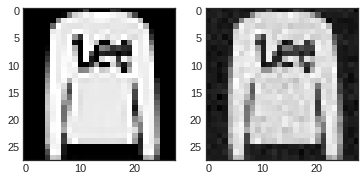

In [23]:
plt.subplot(1, 2, 1).grid(False)
plt.imshow(fashion_mnist_test[1].reshape(28,28))
plt.subplot(1, 2, 2).grid(False)
plt.imshow(np.random.normal(fashion_mnist_test[1].reshape(28,28), scale=10))
plt.show()

### Symmetry Transform
For many datasets, certain symmetry transforms are natural and will take valid data points to valid data points.

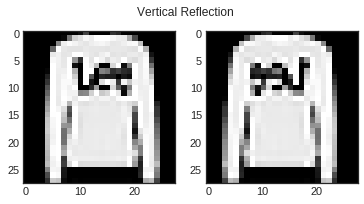

In [24]:
plt.suptitle("Vertical Reflection", y=0.85)
plt.subplot(1, 2, 1).grid(False)
plt.imshow(fashion_mnist_test[1].reshape(28,28))
plt.subplot(1, 2, 2).grid(False)
plt.imshow(fashion_mnist_test[1].reshape(28,28)[:, ::-1])
plt.show()

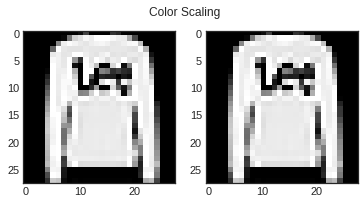

In [25]:
plt.suptitle("Color Scaling", y=0.85)
plt.subplot(1, 2, 1).grid(False)
plt.imshow(fashion_mnist_test[1].reshape(28,28))
plt.subplot(1, 2, 2).grid(False)
plt.imshow(0.5*np.ones((28,28))+0.5*fashion_mnist_test[1].reshape(28,28))
plt.show()

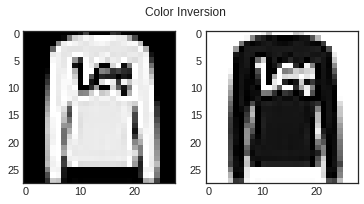

In [26]:
plt.suptitle("Color Inversion", y=0.85)
plt.subplot(1, 2, 1).grid(False)
plt.imshow(fashion_mnist_test[1].reshape(28,28))
plt.subplot(1, 2, 2).grid(False)
plt.imshow(np.ones((28,28))-fashion_mnist_test[1].reshape(28,28))
plt.show()

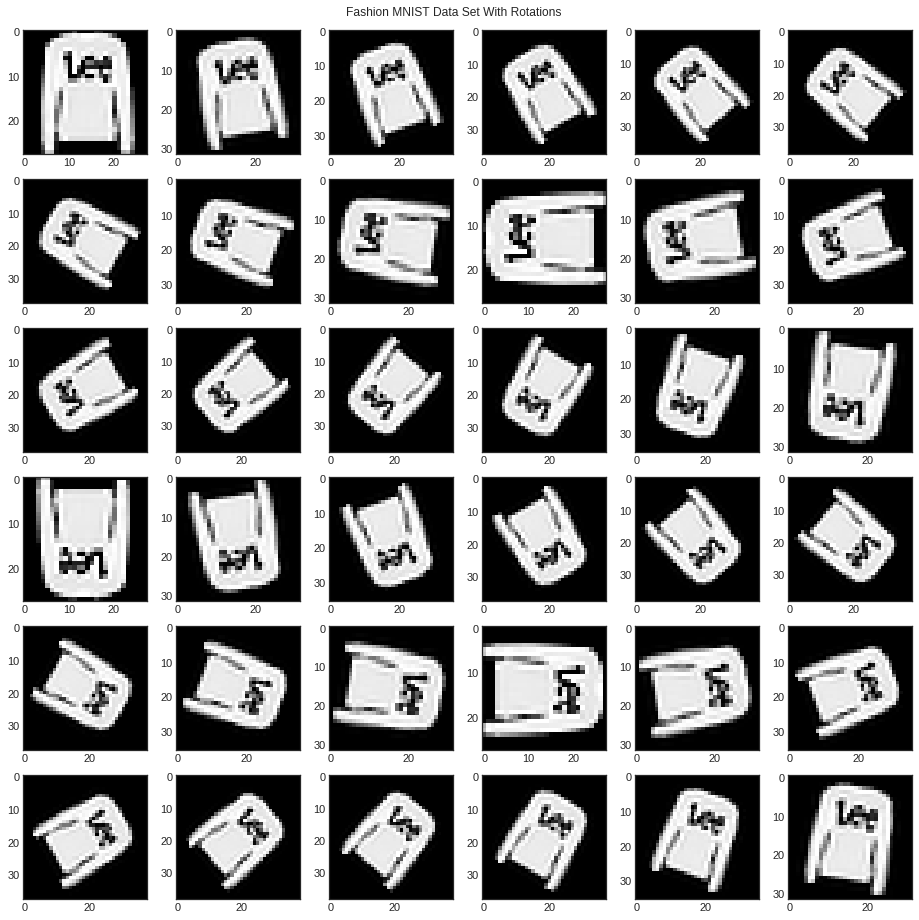

In [27]:
from scipy.ndimage.interpolation import rotate
plt.figure(figsize=(16,16))
plt.suptitle("Fashion MNIST Data Set With Rotations", y=0.9)

for i in range(36):
    ax = plt.subplot(6,6, 1+i)
    ix = np.where(fashion_mnist_label_test==2)[0][0]
    plt.imshow(rotate(fashion_mnist_test[ix].reshape(28,28), 10*i))
    ax.grid(False)
    plt.gray()
plt.show()

## Data Generators
These are the [toy-distribution](http://scikit-learn.org/stable/datasets/index.html#sample-generators) generators provided in the [sklearn](http://scikit-learn.org/stable/modules/classes.html#samples-generator) machine learning API, and data randomly sampled from parametric distributions.


[SciKit Learn Generators](#SciKit-Learn-Generators)
-  [Three Dimensional](#sklearn-3D)
-  [High Dimensional](#sklearn-High-Dimensional)

[Parametric Generators](#Parametric-Generators)
-  [Three Dimensional](#Parametric-3D)
-  [High Dimensional](#Parametric-High-Dimensional)

[Prime Factors](#Prime-Factors)

Back to [Table of Contents](#Table-of-Contents)

### SciKit Learn Generators

#### sklearn 3D

In [28]:
from mpl_toolkits.mplot3d import Axes3D

In [29]:
S, S_color = ds.make_s_curve(1000, random_state=0)
R, R_color = ds.make_swiss_roll(1000, random_state=0)

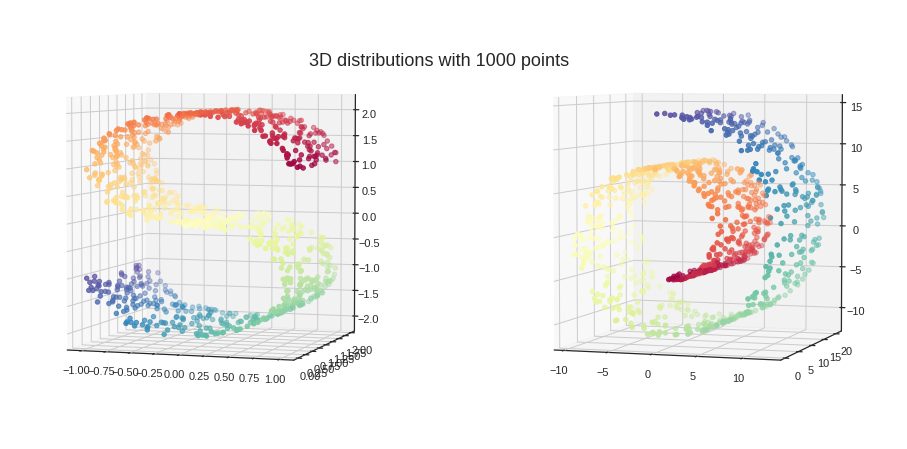

In [30]:
fig = plt.figure(figsize=(16, 8))
plt.suptitle("3D distributions with %i points"
             % 1000, fontsize=18, y=0.8)

for (X,color,i) in [(S, S_color, 1), (R, R_color, 2)]:
    ax = fig.add_subplot(1, 2, i, projection='3d')
    ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
    ax.view_init(4, -72)
plt.show()

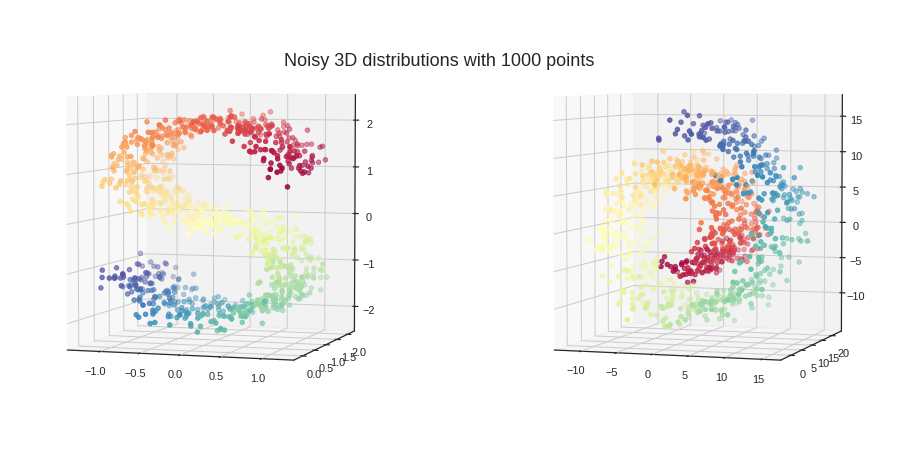

In [31]:
fig = plt.figure(figsize=(16, 8))
plt.suptitle("Noisy 3D distributions with %i points"
             % 1000, fontsize=18, y=0.8)

for (X,color,i) in [(np.random.normal(S, 0.1), S_color, 1), (np.random.normal(R, 1), R_color, 2)]:
    ax = fig.add_subplot(1, 2, i, projection='3d')
    ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
    ax.view_init(4, -72)
plt.show()

#### sklearn High Dimensional

In [32]:
B, B_color = ds.make_blobs(1000, n_features=3,
                           centers=10, random_state=0)

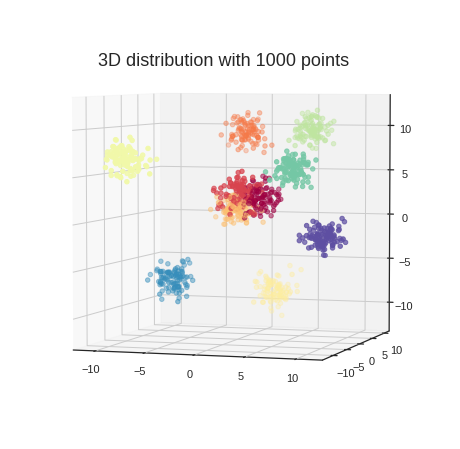

In [33]:
fig = plt.figure(figsize=(8, 8))
plt.suptitle("3D distribution with %i points"
             % 1000, fontsize=18, y=0.8)

ax = fig.add_subplot(1, 1, 1, projection='3d')
ax.scatter(B[:, 0], B[:, 1], B[:, 2], c=B_color, cmap=plt.cm.Spectral)
ax.view_init(4, -72)
plt.show()

Note that make_blobs is already a noisy embedding of (in this case) ten points, we can of course re-noise it, however I believe that this is also possible on the generator level. Consider removing this cell.

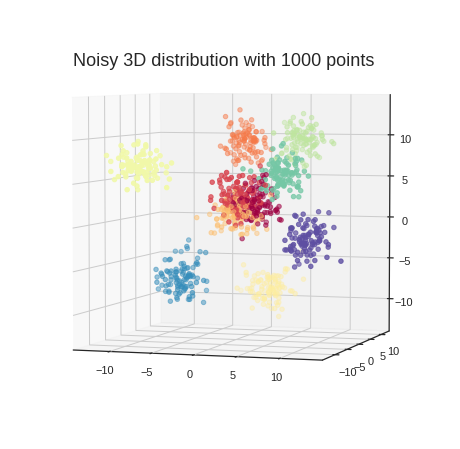

In [34]:
fig = plt.figure(figsize=(8, 8))
plt.suptitle("Noisy 3D distribution with %i points"
             % 1000, fontsize=18, y=0.8)
NB = np.random.normal(B, 1)
ax = fig.add_subplot(1, 1, 1, projection='3d')
ax.scatter(NB[:, 0], NB[:, 1], NB[:, 2], c=B_color, cmap=plt.cm.Spectral)
ax.view_init(4, -72)
plt.show()

### Parametric Generators

#### Parametric 3D

In [35]:
import generators
from generators import *

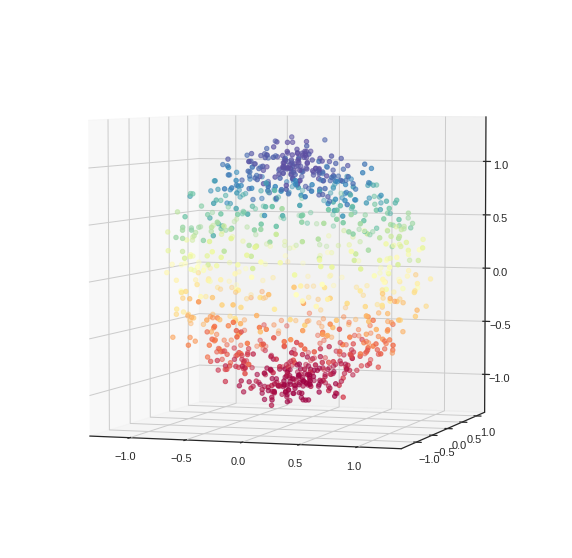

In [36]:
fig = plt.figure(figsize=(10, 10))

X, color = sphere(1000, noise=0.1, uniform=True)

ax = fig.add_subplot(111, projection='3d')
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
ax.view_init(4, -72)
plt.show()

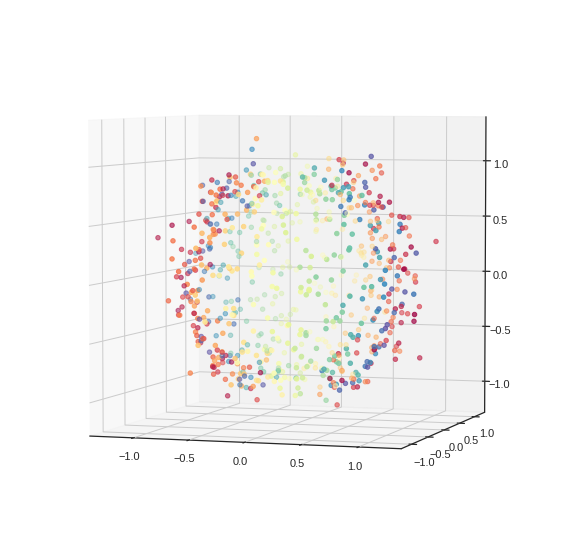

In [37]:
fig = plt.figure(figsize=(10, 10))

X, color = globe(1000, noise=0.1, uniform=True)

ax = fig.add_subplot(111, projection='3d')
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
ax.view_init(4, -72)
plt.show()

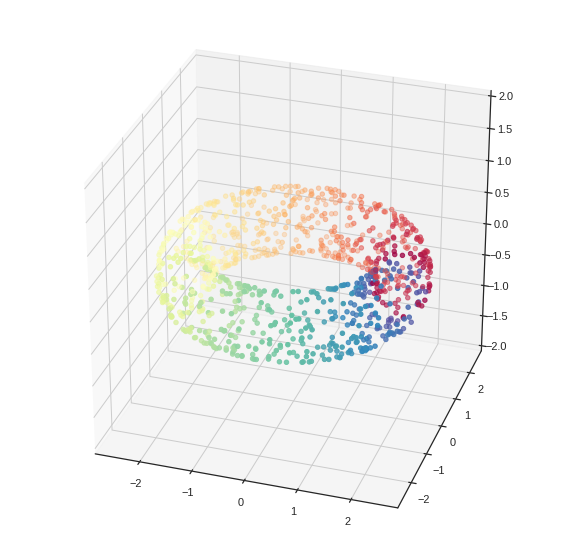

In [38]:
fig = plt.figure(figsize=(10, 10))

X, color = torus(1000, noise=0, uniform=False)

ax = fig.add_subplot(111, projection='3d')
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
ax.view_init(30, -72)
ax.set_zlim3d(-2, 2)

plt.show()

We generate the mobius band by rotating a line segment along a circle and smoothly performing a half twist.

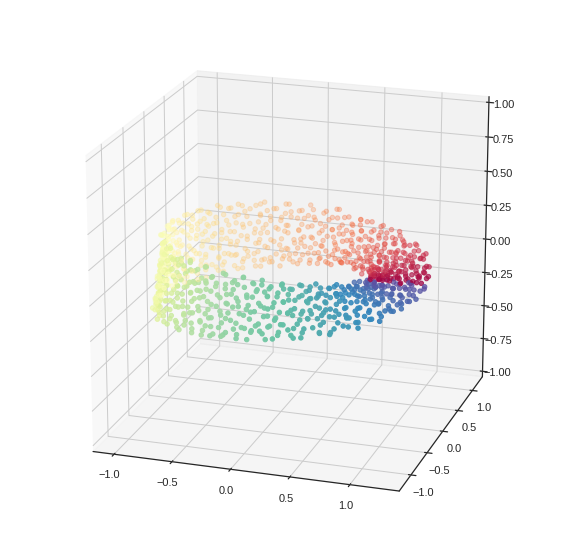

In [39]:
fig = plt.figure(figsize=(10, 10))

X, color = mobius_strip(1000, noise=0.01, uniform=True)

ax = fig.add_subplot(111, projection='3d')
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)

ax.view_init(20, -72)
ax.set_zlim3d(-1, 1)
plt.show()

We can generate toroidal knots with rational curves.  A (3,2) knot loops vertically 3 times and horizontally 2 times to reproduce the trefoil knot.

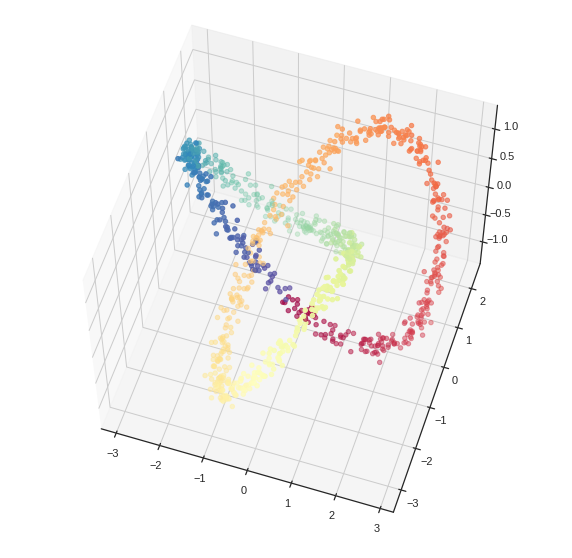

In [40]:
fig = plt.figure(figsize=(10, 10))

X, color = trefoil_knot(1000, noise=0.1, uniform=False)

ax = fig.add_subplot(111, projection='3d')
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
ax.view_init(60, -72)
plt.show()

Matplotlib Lorenz chaotic system attractor [example](https://matplotlib.org/examples/mplot3d/lorenz_attractor.html).

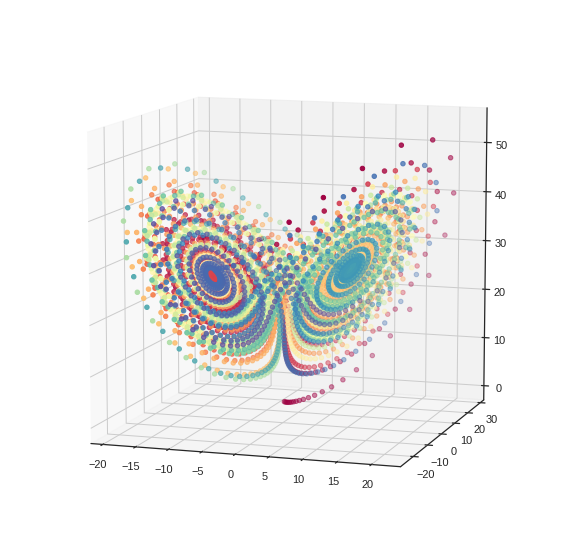

In [41]:
fig = plt.figure(figsize=(10, 10))

X, color = lorenz_attractor(5000, noise=0, uniform=True)

ax = fig.add_subplot(111, projection='3d')
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
ax.view_init(10, -72)
plt.show()

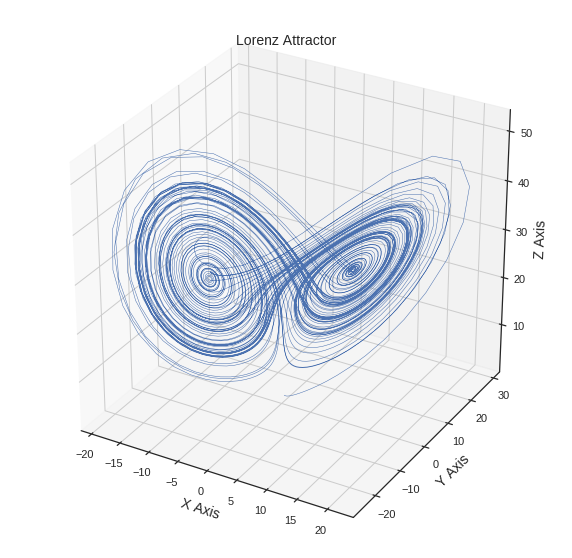

In [42]:
fig = plt.figure(figsize=(10, 10))
ax = fig.gca(projection='3d')

ax.plot(X[:,0], X[:,1], X[:,2], lw=0.5)
ax.set_xlabel("X Axis")
ax.set_ylabel("Y Axis")
ax.set_zlabel("Z Axis")
ax.set_title("Lorenz Attractor")

plt.show()

Rossler attractor code borrowed from [blog post](https://vedransekara.github.io/2016/11/14/strange_attractors.html).

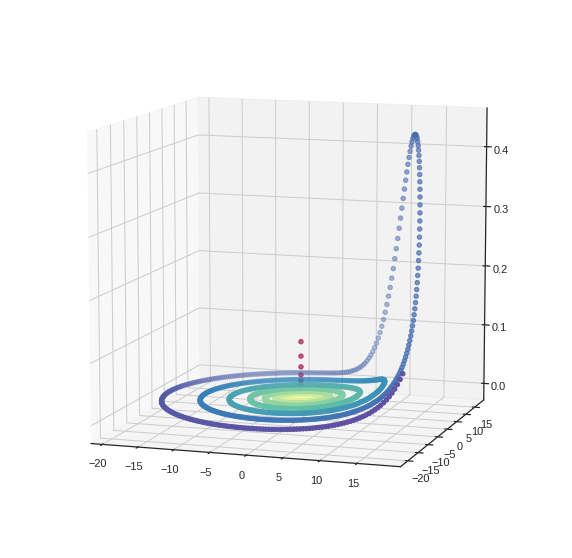

In [43]:
fig = plt.figure(figsize=(10, 10))

X, color = rossler_attractor(5000, noise=0, uniform=True)

ax = fig.add_subplot(111, projection='3d')
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
ax.view_init(10, -72)
plt.show()

Thomas' cyclically symmetric attractor equations borrowed from [wikipedia](https://en.wikipedia.org/wiki/Thomas%27_cyclically_symmetric_attractor).

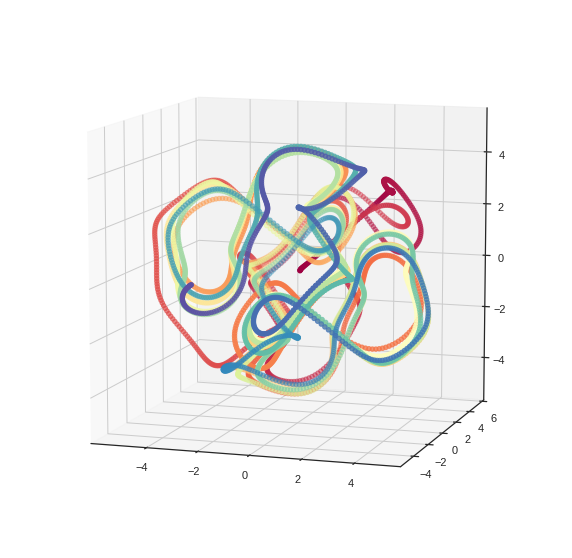

In [44]:
fig = plt.figure(figsize=(10, 10))

X, color = thomas_attractor(5000, noise=0, uniform=True)

ax = fig.add_subplot(111, projection='3d')
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
ax.view_init(10, -72)
plt.show()

#### Parametric High Dimensional

The Klein bottle is a non-orientable $\mathbb{R}$ $2$-manifold with minimal [embedding](https://en.wikipedia.org/wiki/Klein_bottle#4-D_non-intersecting) dimension $4$.

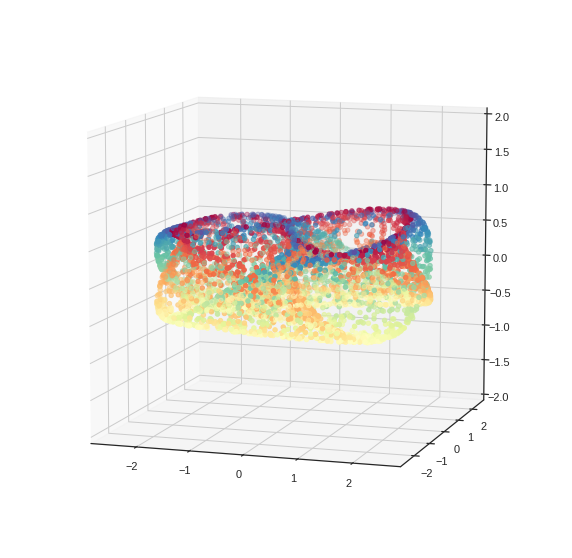

In [45]:
# plot first three variables
fig = plt.figure(figsize=(10, 10))

X, color = folded_klein_bottle(5000, noise=0, uniform=False)

ax = fig.add_subplot(111, projection='3d')
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
ax.view_init(10, -72)
ax.set_zlim3d(-2, 2)
plt.show()

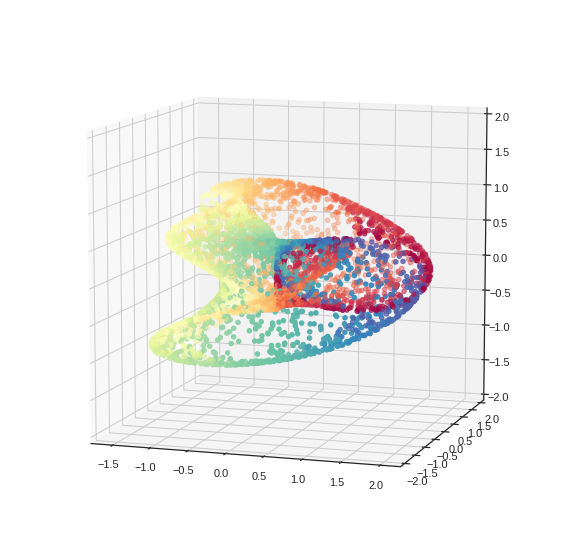

In [46]:
# plot first three variables
fig = plt.figure(figsize=(10, 10))

X, color = klein_bottle(5000, noise=0, uniform=False)

ax = fig.add_subplot(111, projection='3d')
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
ax.view_init(10, -72)
ax.set_zlim3d(-2, 2)
plt.show()

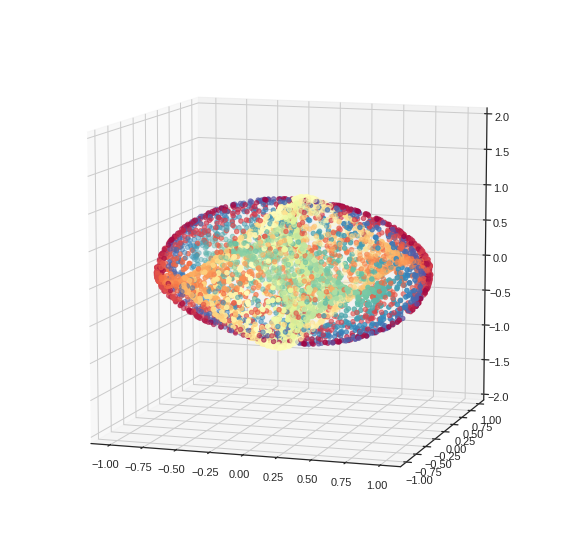

In [47]:
# plot first three variables
fig = plt.figure(figsize=(10, 10))

X, color = S3_klein_bottle(5000, noise=0, uniform=False)

ax = fig.add_subplot(111, projection='3d')
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
ax.view_init(10, -72)
ax.set_zlim3d(-2, 2)
plt.show()

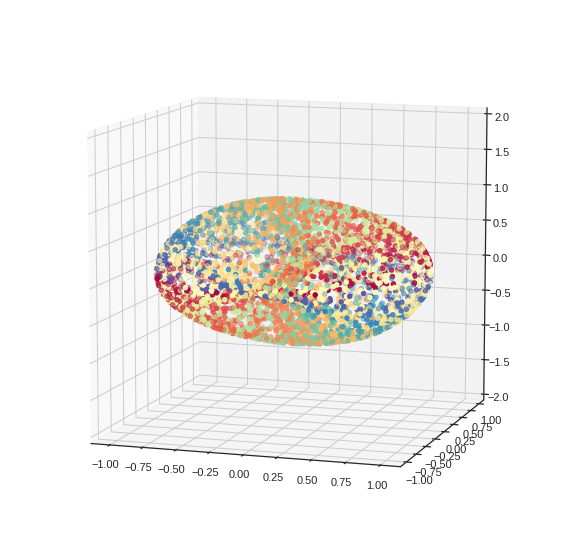

In [48]:
# plot first three variables
fig = plt.figure(figsize=(10, 10))

X, color = S3_torus(5000, noise=0, uniform=False)

ax = fig.add_subplot(111, projection='3d')
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
ax.view_init(10, -72)
ax.set_zlim3d(-2, 2)
plt.show()

Code sourced from [wikipedia](https://en.wikipedia.org/wiki/Lorenz_96_model).

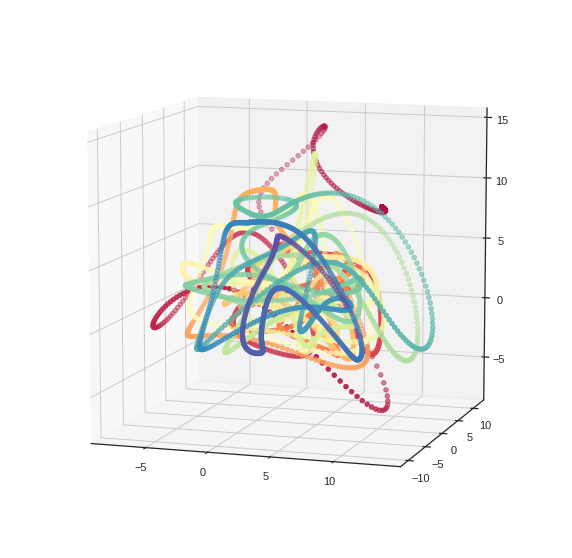

In [49]:
# plot first three variables
fig = plt.figure(figsize=(10, 10))

X, color = Lorenz96_attractor(5000, noise=0, uniform=True)

ax = fig.add_subplot(111, projection='3d')
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
ax.view_init(10, -72)
plt.show()

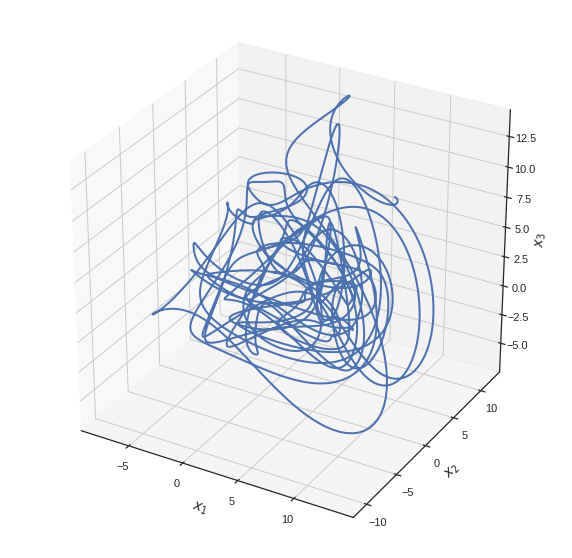

In [50]:
# plot first three variables
X, _ = Lorenz96_attractor(5000, noise=0, uniform=True)
# this only works with uniform sampling
fig = plt.figure(figsize=(10, 10))
ax = fig.gca(projection='3d')
ax.plot(X[:,0], X[:,1], X[:,2])
ax.set_xlabel('$x_1$')
ax.set_ylabel('$x_2$')
ax.set_zlabel('$x_3$')
plt.show()

### Prime Factors

Check out this [blog](https://johnhw.github.io/umap_primes/index.md.html)

In [51]:
import primeFactors
from primeFactors import *

In [52]:
### Generate the matrix for 1 million integers
n = 400_000
P = factor_vector_lil(n) 
print(P.shape)

100000
200000
300000
(400000, 33923)


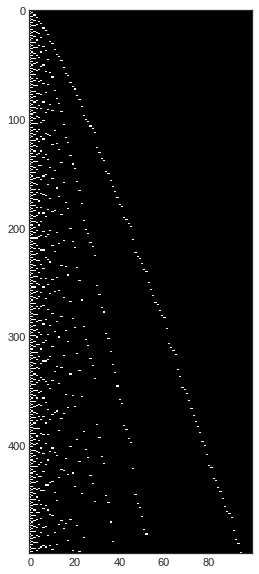

In [53]:
plt.figure(figsize=(4,10))
plt.imshow(P[:500, :100].todense(),aspect='auto');

## Dimensional Reduction

**[Linear Methods](#Linear-Methods)**
-  [Principle Component Analysis](#PCA)
-  [Sparse Principle Component Analysis](#SparsePCA)
-  [Independent Component Analysis](#ICA)
-  [Non-Negative Matrix Factorization](#NMF)
-  [Kernel PCA](#Kernel-PCA)

**[Linear Probabalistic Methods](#Linear-Probabalistic-Methods)**
-  [Factor Analysis](#Factor-Analysis)
-  [Probabalistic PCA](#Probabalistic-PCA)
-  [Latent Dirichlet Allocation](#Latent-Dirichlet-Allocation)

**[Manifold Learning Methods](#Manifold-Learning-Methods)**
-  [Local Linear Embedding](#Local-Linear-Embedding)
-  [Local Tangent Space Alignment](#Local-Tangent-Space-Alignment)
-  [Multi Dimensional Scaling](#Multi-Dimensional-Scaling)
-  [Spectral Embedding](#Spectral-Embedding)
-  [Isomap](#Isomap)
-  [t-SNE](#t-SNE)
-  [UMAP](#UMAP)

**[Deep Representation Learning](#Deep-Representation-Learning)**
-  [Classifier](#Classifier)
-  [Autoencoder](#Autoencoder)
-  [Variational Autoencoder](#VAE)

Back to [Table of Contents](#Table-of-Contents)

In [54]:
# http://scikit-learn.org/stable/auto_examples/manifold/plot_lle_digits.html
def plot_embedding(embed, title=None, show_classes=True, show_examples=True):
    # Determine range of values of embedded points
    x_min, x_max = np.min(embed, 0), np.max(embed, 0)
    # Scale all points between 0 and 1
    scaled_embed = (embed - x_min) / (x_max - x_min)
    
    # Instantiate figure
    plt.figure(figsize=(12,12))
    ax = plt.subplot(111)
    
    if show_classes:
        # Color each number differently (shows how we expect data to cluster)
        for i in range(scaled_embed.shape[0]):
            plt.plot(scaled_embed[i,0], scaled_embed[i,1], '.', ms=12,
                     color = plt.cm.Set1(digits.target[i]/10))
    else:
        plt.plot(scaled_embed[:,0], scaled_embed[:,1], '.k')
    
    if show_examples:
        if hasattr(mpl.offsetbox, 'AnnotationBbox'):
            # Only print thumbnail with matplotlib > 1.0;
            # initialize shown_images array
            shown_images = np.array([[1, 1]])

            # Iterate through the number of digits we imported
            for i in range(digits.data.shape[0]):
                dist = np.sum((scaled_embed[i] - shown_images) **2, 1)
                # Don't put thumbnails too close together
                if np.min(dist) < 4e-3:
                    continue
                # Concatenate the  locations of the images to be plotted
                shown_images = np.r_[shown_images, [scaled_embed[i]]]
                # Define the grayscale image of the number
                imagebox = mpl.offsetbox.AnnotationBbox(
                    mpl.offsetbox.OffsetImage(digits.images[i], cmap=plt.cm.gray_r),
                    scaled_embed[i])
                ax.add_artist(imagebox)
                
    # Remove x and y ticks
    plt.xticks([]), plt.yticks([])
    if title is not None:
        plt.title(title)

### Linear Methods
This class of [algorithms](http://scikit-learn.org/stable/modules/classes.html#module-sklearn.decomposition) attempts to approximate the data distribution with a low rank linear subspace within some (possibly enriched) feature space.  Nonlinearities may be accounted for using the [kernel trick](https://en.wikipedia.org/wiki/Kernel_method).  Algorithms of this type attempt to solve a [matrix factorization](https://stat.columbia.edu/~cunningham/pdf/CunninghamJMLR2015.pdf) problem, given some regularization scheme on the factors i.e. independence ([ICA](http://scikit-learn.org/stable/modules/generated/sklearn.decomposition.FastICA.html)), non-linear kernel ([KPCA](http://scikit-learn.org/stable/modules/generated/sklearn.decomposition.KernelPCA.html)), L1 ([SparsePCA](http://scikit-learn.org/stable/modules/generated/sklearn.decomposition.SparsePCA.html)), L2 ([PCA](http://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)), ([RobustPCA](https://github.com/dganguli/robust-pca)), Gaussian ([PPCA](http://scikit-learn.org/stable/modules/generated/sklearn.decomposition.FactorAnalysis.html)), Dirichlet ([LDA](http://scikit-learn.org/stable/modules/generated/sklearn.decomposition.LatentDirichletAllocation.html)), Non-Negative ([NMF](http://scikit-learn.org/stable/modules/generated/sklearn.decomposition.NMF.html#sklearn.decomposition.NMF)), etc.

In [55]:
from sklearn import decomposition

#### PCA

In [56]:
transformer = decomposition.PCA(n_components=2, random_state=0)
X_transformed = transformer.fit_transform(digits.data)

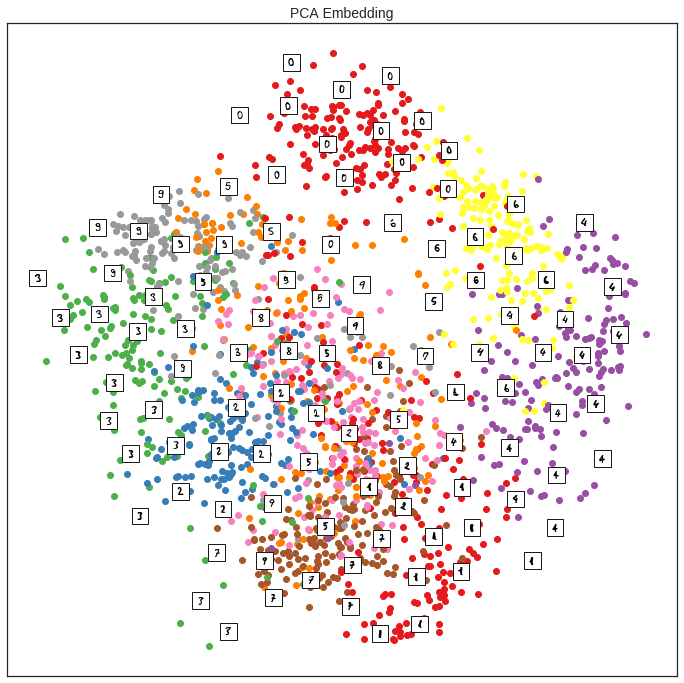

In [57]:
plot_embedding(X_transformed, "PCA Embedding", show_classes=True, show_examples=True)

#### SparsePCA

In [58]:
transformer = decomposition.SparsePCA(n_components=2, random_state=0)
X_transformed = transformer.fit_transform(digits.data)

/home/ian/anaconda3/lib/python3.6/site-packages/sklearn/decomposition/sparse_pca.py:170: DeprecationWarning: normalize_components=False is a backward-compatible setting that implements a non-standard definition of sparse PCA. This compatibility mode will be removed in 0.22.
  DeprecationWarning)


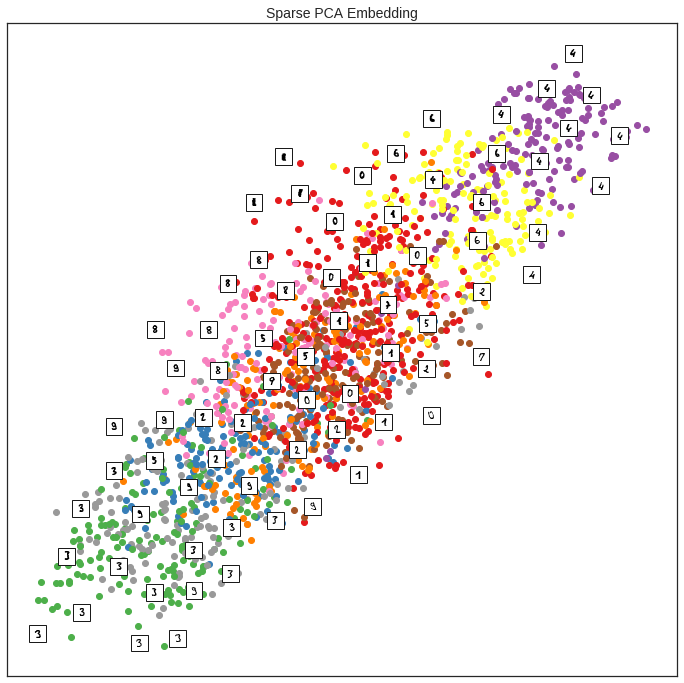

In [59]:
plot_embedding(X_transformed, "Sparse PCA Embedding", show_classes=True, show_examples=True)

#### ICA

In [60]:
transformer = decomposition.FastICA(n_components=2, random_state=0)
X_transformed = transformer.fit_transform(digits.data)

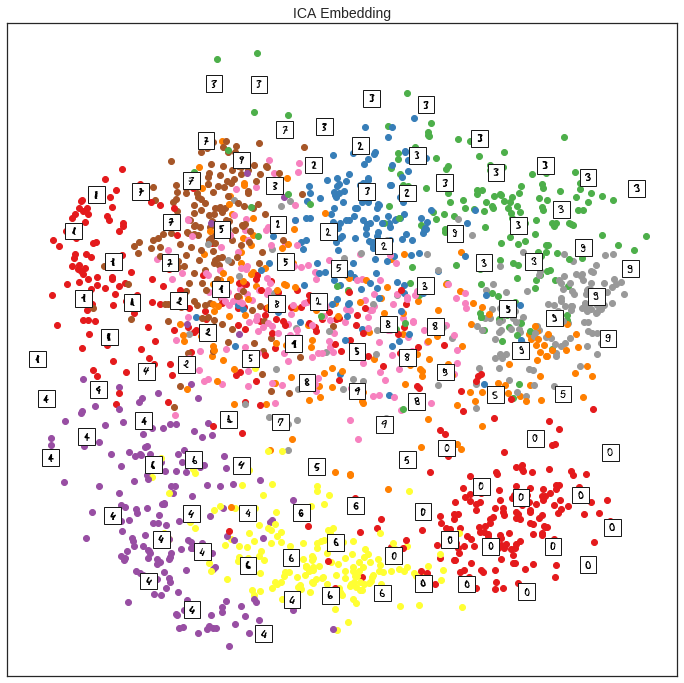

In [61]:
plot_embedding(X_transformed, "ICA Embedding", show_classes=True, show_examples=True)

#### NMF
This algorithm only applies to non-negative matrices.

In [62]:
transformer = decomposition.NMF(n_components=2, random_state=0)
X_transformed = transformer.fit_transform(digits.data)

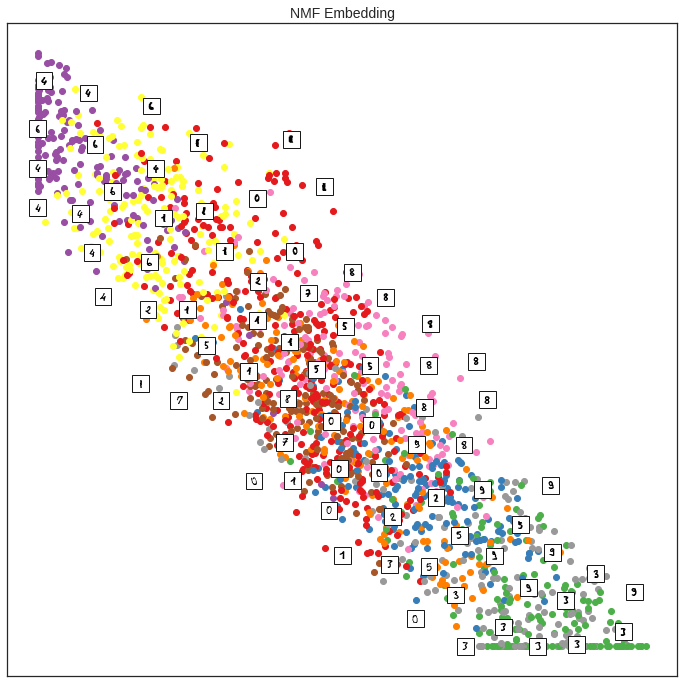

In [63]:
plot_embedding(X_transformed, "NMF Embedding", show_classes=True, show_examples=True)

#### Kernel PCA

### Linear Probabalistic Methods
Factor Analysis, Probabilistic PCA, and Latent Dirichlet Allocation are probabilistic models. These are generative models with continuous latent variables, and linear interactions.  The consequence is that the likelihood of new data can be used for model selection and covariance estimation.

#### Factor Analysis
FactorAnalysis performs a maximum likelihood estimate of the loading matrix, the transformation of the latent variables to the observed ones, using expectation-maximization (EM).

In [64]:
transformer = decomposition.FactorAnalysis(n_components=2, random_state=0)
X_transformed = transformer.fit_transform(digits.data)

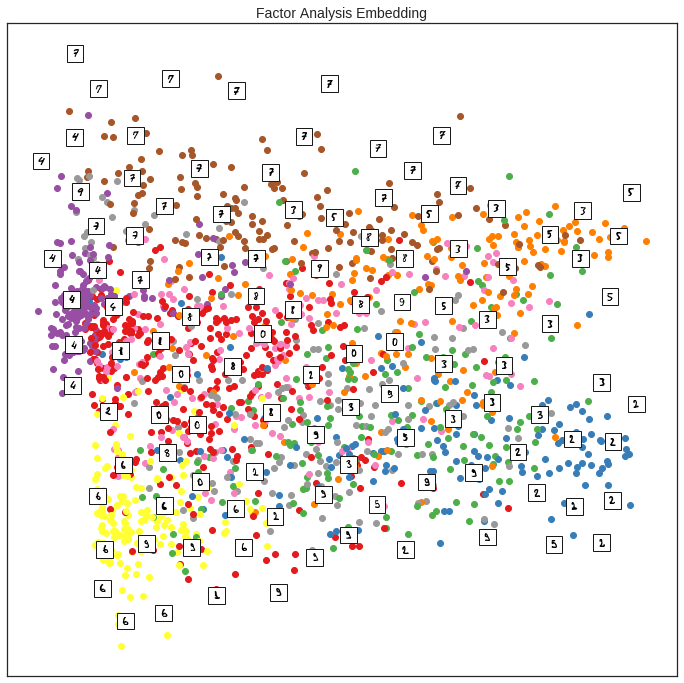

In [65]:
plot_embedding(X_transformed, "Factor Analysis Embedding", show_classes=True, show_examples=True)

#### Probabalistic PCA
If we restrict the factor analysis model further, by assuming that the Gaussian noise is even isotropic (all diagonal entries are the same) we would obtain PPCA.

#### Latent Dirichlet Allocation

In [66]:
transformer = decomposition.LatentDirichletAllocation(n_components=3, random_state=0, doc_topic_prior=0.9)
X_transformed = transformer.fit_transform(digits.data)

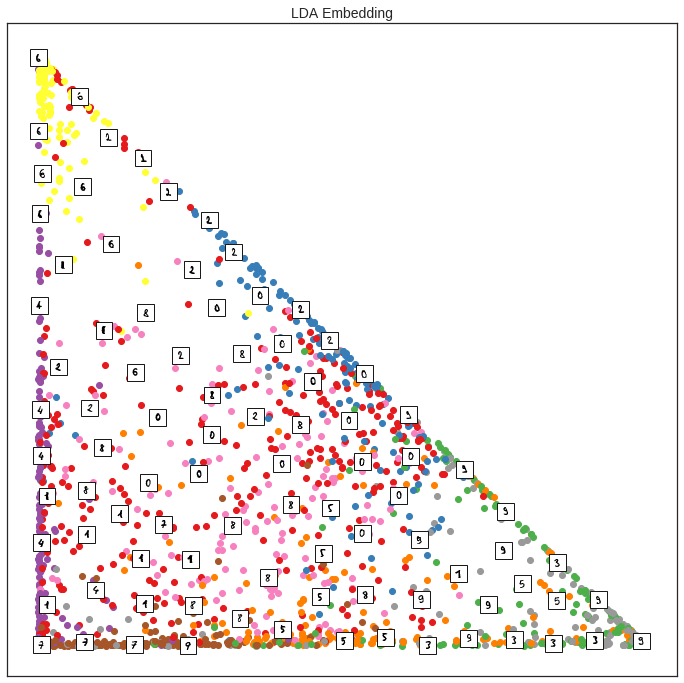

In [67]:
plot_embedding(X_transformed[:,:2], "LDA Embedding", show_classes=True, show_examples=True)

### Manifold Learning Methods
This class of [algorithms](http://scikit-learn.org/stable/modules/classes.html#module-sklearn.manifold) assumes the [manifold](https://en.wikipedia.org/wiki/Nonlinear_dimensionality_reduction) [hypothesis](colah.github.io/posts/2014-03-NN-Manifolds-Topology/), where high dimensional data lies on a low dimensional subspace with smooth geometric properties.  We approximate this geometry with a nearest neighbor graph, or a fuzzy nearest neighbor graph in the cases of [t-SNE](https://distill.pub/2016/misread-tsne/) and [UMAP](https://umap-learn.readthedocs.io/en/latest/index.html).

In [68]:
from sklearn import manifold
from umap import UMAP

#### Local Linear Embedding

In [69]:
transformer = manifold.LocallyLinearEmbedding(n_neighbors=30, n_components=2, method='standard')
X_transformed = transformer.fit_transform(digits.data)

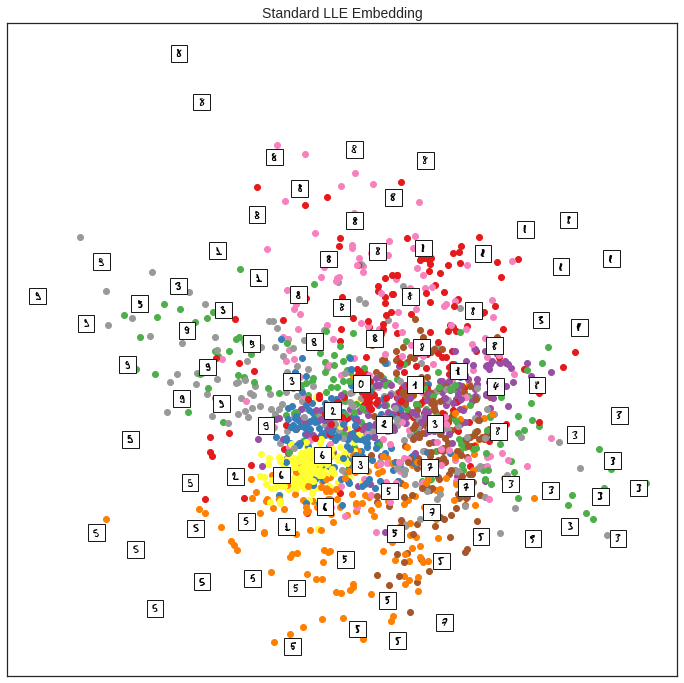

In [70]:
plot_embedding(X_transformed, "Standard LLE Embedding", show_classes=True, show_examples=True)

In [71]:
transformer = manifold.LocallyLinearEmbedding(n_neighbors=30, n_components=2, method='modified')
X_transformed = transformer.fit_transform(digits.data)

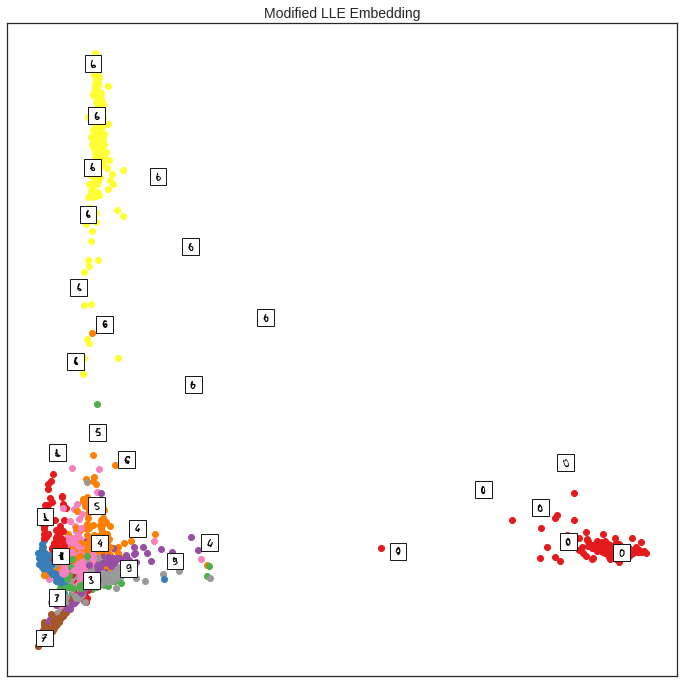

In [72]:
plot_embedding(X_transformed, "Modified LLE Embedding", show_classes=True, show_examples=True)

In [73]:
transformer = manifold.LocallyLinearEmbedding(n_neighbors=30, n_components=2, method='hessian')
X_transformed = transformer.fit_transform(digits.data)

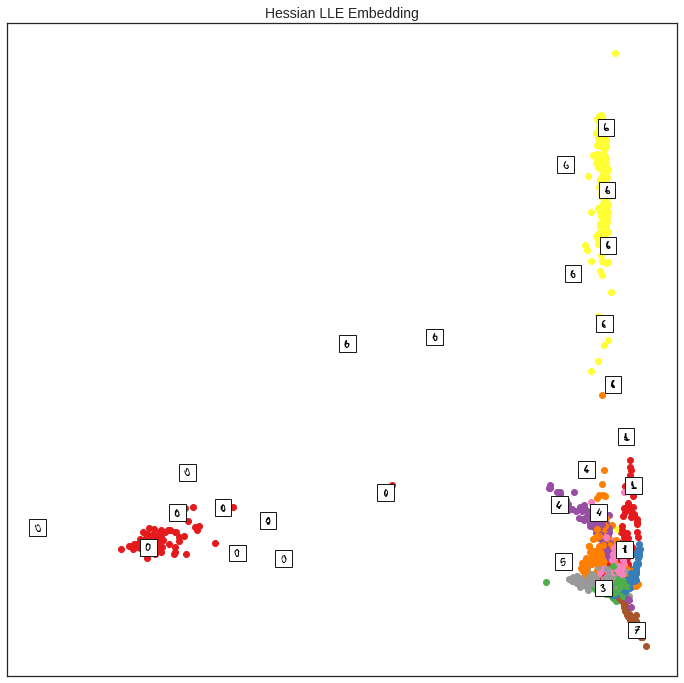

In [74]:
plot_embedding(X_transformed, "Hessian LLE Embedding", show_classes=True, show_examples=True)

#### Local Tangent Space Alignment

In [75]:
transformer = manifold.LocallyLinearEmbedding(n_neighbors=30, n_components=2, method='ltsa')
X_transformed = transformer.fit_transform(digits.data)

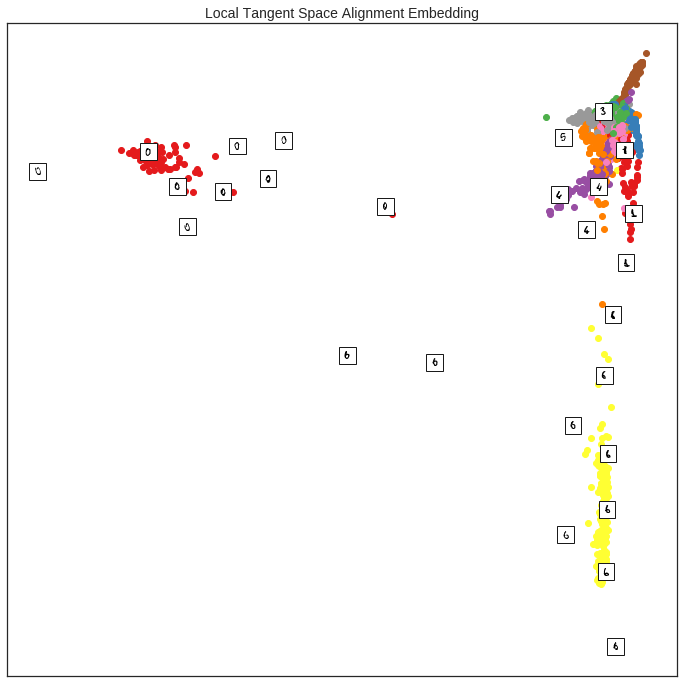

In [76]:
plot_embedding(X_transformed, "Local Tangent Space Alignment Embedding", show_classes=True, show_examples=True)

#### Multi Dimensional Scaling

In [77]:
transformer = manifold.MDS(n_components=2)
X_transformed = transformer.fit_transform(digits.data)

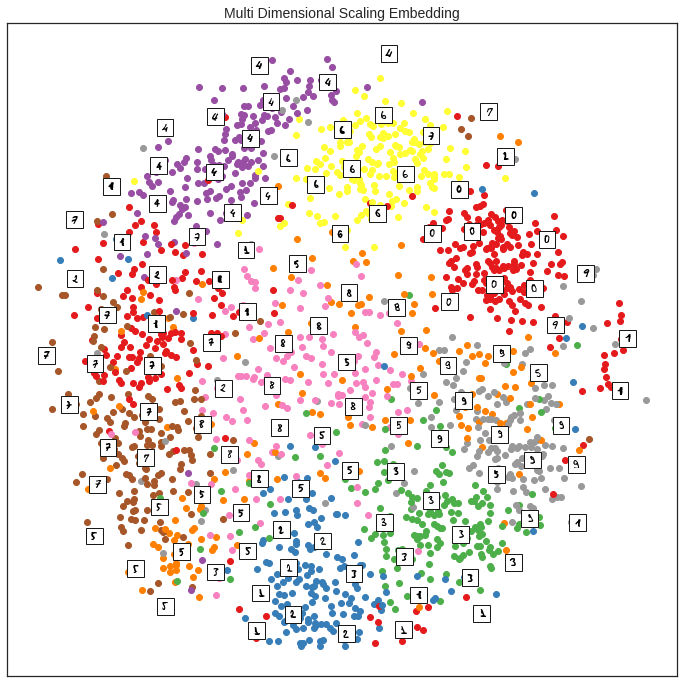

In [78]:
plot_embedding(X_transformed, "Multi Dimensional Scaling Embedding", show_classes=True, show_examples=True)

#### Spectral Embedding

In [79]:
transformer = manifold.SpectralEmbedding(n_components=2, random_state=0)
X_transformed = transformer.fit_transform(digits.data)

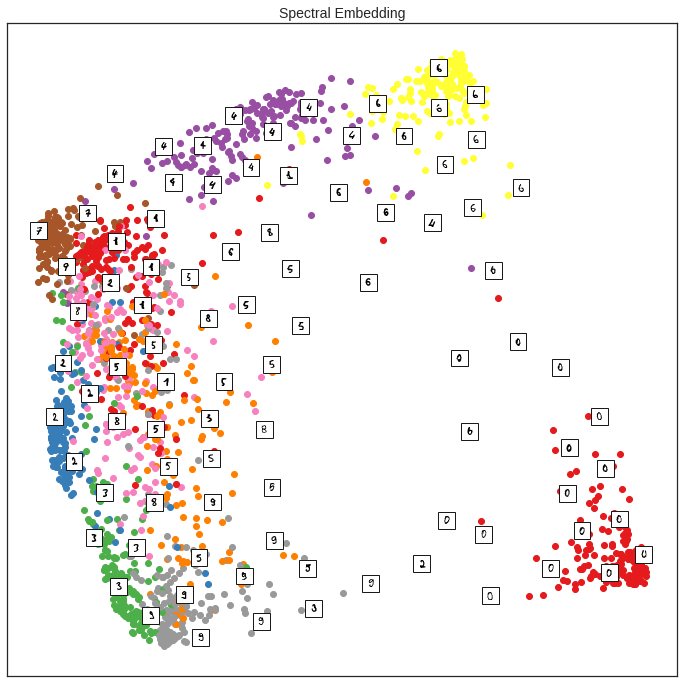

In [80]:
plot_embedding(X_transformed, "Spectral Embedding", show_classes=True, show_examples=True)

#### Isomap

In [81]:
transformer = manifold.Isomap(n_neighbors=10, n_components=2)
X_transformed = transformer.fit_transform(digits.data)

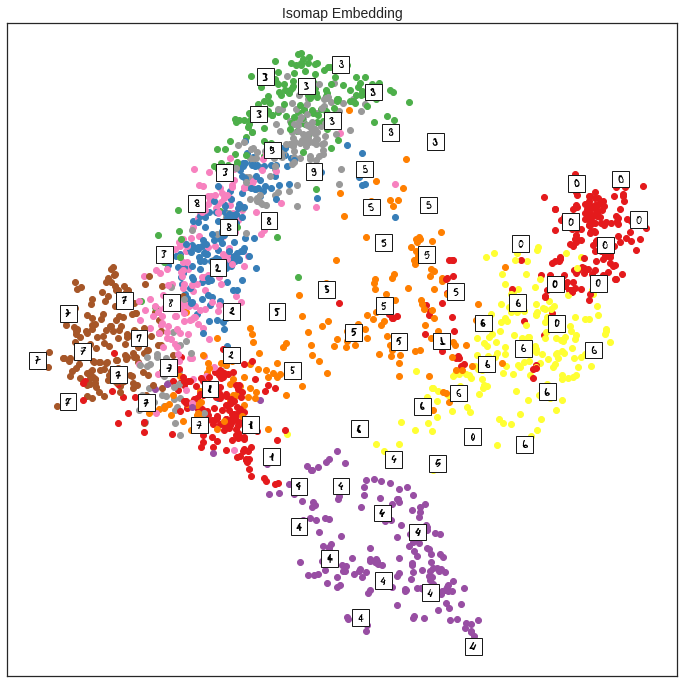

In [82]:
plot_embedding(X_transformed, "Isomap Embedding", show_classes=True, show_examples=True)

#### t-SNE

In [83]:
transformer = manifold.TSNE(perplexity=10, n_components=2, init='pca')
X_transformed = transformer.fit_transform(digits.data)

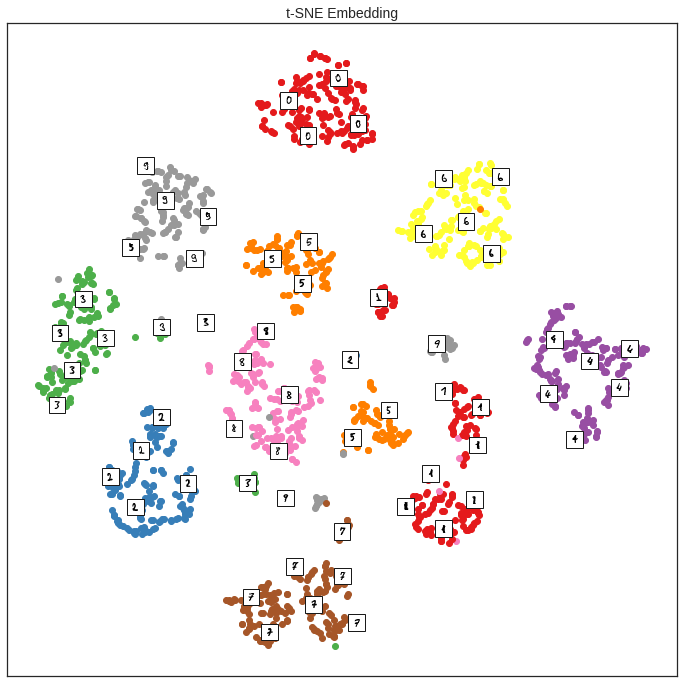

In [84]:
plot_embedding(X_transformed, "t-SNE Embedding", show_classes=True, show_examples=True)

#### UMAP

In [85]:
transformer = UMAP(n_neighbors=10, n_components=2)
X_transformed = transformer.fit_transform(digits.data)

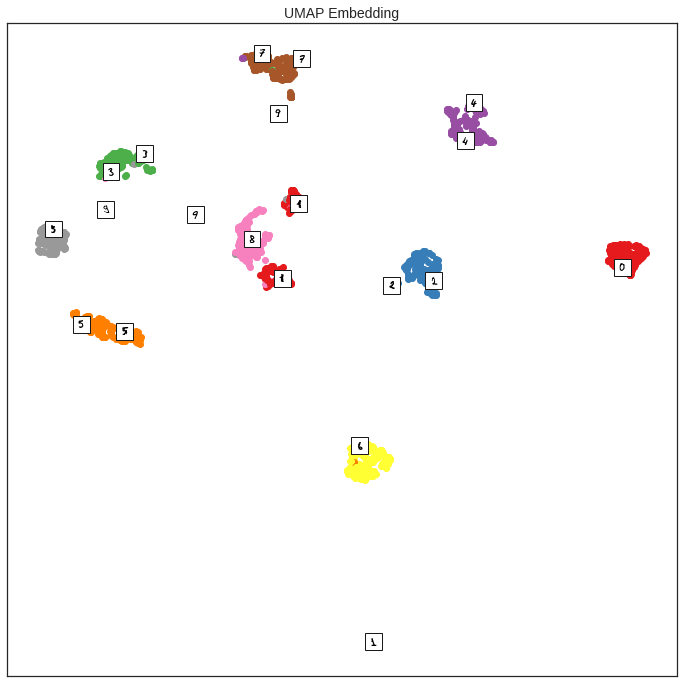

In [86]:
plot_embedding(X_transformed, "UMAP Embedding", show_classes=True, show_examples=True)

### Deep Representation Learning
Data presentation here is extracted from a hidden representation of a trained deep neural network.

#### Classifier

We perform supervised learning on lableled data, and sample from a low dimensional hidden layer representation.

#### Autoencoder

#### VAE

We perform unsupervised learning of a [generator-inference model](https://arxiv.org/pdf/1312.6114.pdf) of the data distribution to perform lossy compression.  Data compresion most closely resembles [kernel](http://jmlr.csail.mit.edu/papers/volume6/lawrence05a/lawrence05a.pdf) [PPCA](https://www.microsoft.com/en-us/research/wp-content/uploads/2016/02/bishop-ppca-jrss.pdf) with a learned piecewise linear kernel (linear combinaltions of the ReLU activation).

## Point Cloud Structure

### Local Structure
This should include a discussion of metrics, affinity graphs, thresholds, knn algorithm, and the heat kernel weighting scheme.  We should also consider perplexity and the stochastic neighborhoods used in t-SNE, as well as the fuzzy simplex thresholds used in UMAP.

### Global Structure
This should include a discussion on objective functions KL-divergence and cross-entropy, particularly what it preserves.  We should address how simplicial structure encodes global structure in the objective function.

## Performance Metrics
Naturally, the final determination of the success of an algorithm is how well it solves your problem. For the purpose of determing the correct for your problem, it is helpful to measure what the algorithm is actually revealing.  No metric is perfect, and if we could identify the right metric for a given problem, we could perform variational training against that metric.  Here we review some popular metrics in practice for revealing the performance of dimensional reduction schemes.

In [87]:
# https://arxiv.org/pdf/1711.06252.pdf

In [88]:
# https://pdfs.semanticscholar.org/3fca/9cfd207fee838bbf7a3a8dcfe757cb5d4f81.pdf

In [89]:
# watch https://scikit-tda.org/

## UMAP Parameters
https://umap-learn.readthedocs.io/en/latest/parameters.html

`UMAP` is a fairly flexible non-linear dimension reduction algorithm. It seeks to learn the manifold structure of your data and find a low dimensional embedding that preserves the essential topological structure of that manifold. In this notebook we will generate some visualisable 4-dimensional data, demonstrate how to use `UMAP` to provide a 2-dimensional representation of it, and then look at how various `UMAP` parameters can impact the resulting embedding. This notebook is based on the work of Philippe Rivière for visionscarto.net.

To start we'll need some basic libraries. First `numpy` will be needed for basic array manipulation. Since we will be visualising the results we will need `matplotlib` and `seaborn`. Finally we will need `umap` for doing the dimension reduction itself.

In [90]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import umap
%matplotlib inline
sns.set(style='white', rc={'figure.figsize':(12,8)})

Next we will need some data to embed into a lower dimensional representation. To make the 4-dimensional data "visualisable" we will generate data uniformly at random from a 4-dimensional cube such that we can interpret a sample as a tuple of (R,G,B,a) values specifying a color (and translucency). Thus when we plot low dimensional representations each point can colored according to its 4-dimensional value. For this we can use `numpy`. We will fix a random seed for the sake of consistency.

In [91]:
np.random.seed(42)
data = np.random.rand(800, 4)

Now we need to find a low dimensional representation of the data. The umap library provides a `UMAP` class that is fully compatible with `scikit-learn`. Thus, if you are familiar with `scikit-learn` the following will seem natural. For those no faimilar with the excellent `scikit-learn` library, the first step is to instantiate an object of the `UMAP` class (the hyperparameters for the model are set at this stage, as we will see shortly); that object then provides some standard methods, notably `fit` and `fit_transform`. These methods take a dataset, and fit the model to the data. In the case of `fit_transform` the return value is the transformation of the data under the resulting fitting.

In [92]:
fit = umap.UMAP()
%time u = fit.fit_transform(data)

CPU times: user 1.88 s, sys: 161 ms, total: 2.04 s
Wall time: 1.67 s


The resulting value u is a 2-dimensional representation of the data. We can visualise the result by using `matplotlib` to draw a scatter plot of u. We can color each point of the scatter plot by the associated 4-dimensional color from the source data.

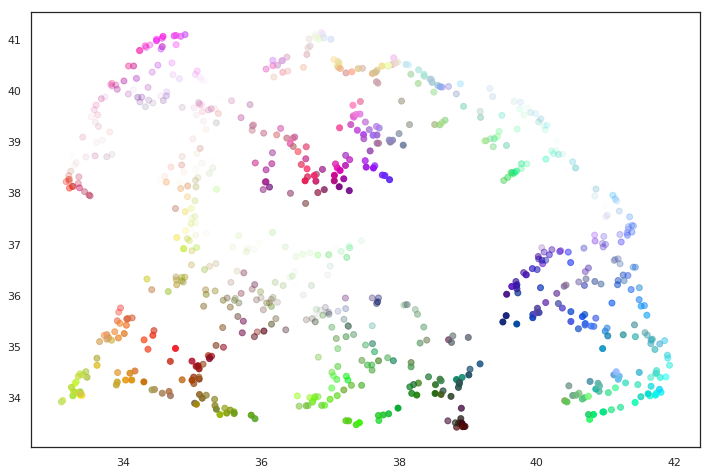

In [93]:
plt.scatter(u[:,0], u[:,1], c=data)

As you can see the result is that the data is placed in 2-dimensional space such that points that were nearby in in 4-dimensional space (i.e. are similar colors) are kept close together. Since we drew a random selection of points in the color sube there is a certain amount of induced structure from where the random points happened to clump up in color space.

### Parameter Selection
`UMAP` has several hyperparameters that can have a significant impact on the resulting embedding. In this notebook we will be covering the four major ones:

-  `n_neighbors`
-  `min_dist`
-  `n_components`
-  `metric`

Each of these parameters has a distinct effect, and we will look at each in turn. To make exploration simpler we will first write a short utility function that can fit the data with `UMAP` given a set of parameter choices, and plot the result.

In [94]:
def draw_umap(n_neighbors=15, min_dist=0.1, n_components=2, metric='euclidean', title=''):
    fit = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        metric=metric
    )
    u = fit.fit_transform(data);
    fig = plt.figure()
    if n_components == 1:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], range(len(u)), c=data)
    if n_components == 2:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], u[:,1], c=data)
    if n_components == 3:
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(u[:,0], u[:,1], u[:,2], c=data)
    plt.title(title, fontsize=18)

### `n_neighbors`

This parameter controls how `UMAP` balances local versus global structure in the data. It does this by constraining the size of the local neighborhood `UMAP` will look at when attempting to learn the manifold structure of the data. This means that low values of `n_neighbors` will force `UMAP` to concentrate on very local structure (potentially to the detriment of the big picture), while large values will push `UMAP` to look at larger neighborhoods of each point when estimating the manifold structure of the data, loosing fine detail structure for the sake of getting the broader of the data.

We can see that in practice by fitting our dataset with `UMAP` using a range of `n_neighbors` values. The default value of `n_neighbors` for `UMAP` (as used above) is 15, but we will look at values ranging from 2 (a very local view of the manifold) up to 200 (a quarter of the data).


/home/ian/anaconda3/lib/python3.6/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 226 separate connected components using meta-embedding (experimental)
  n_components


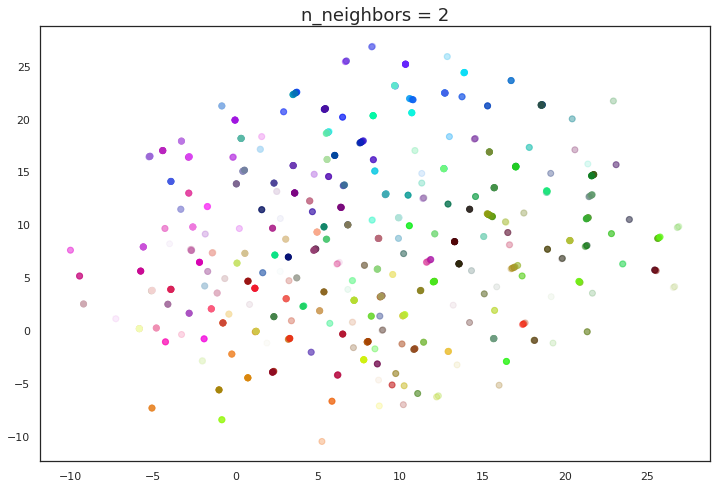

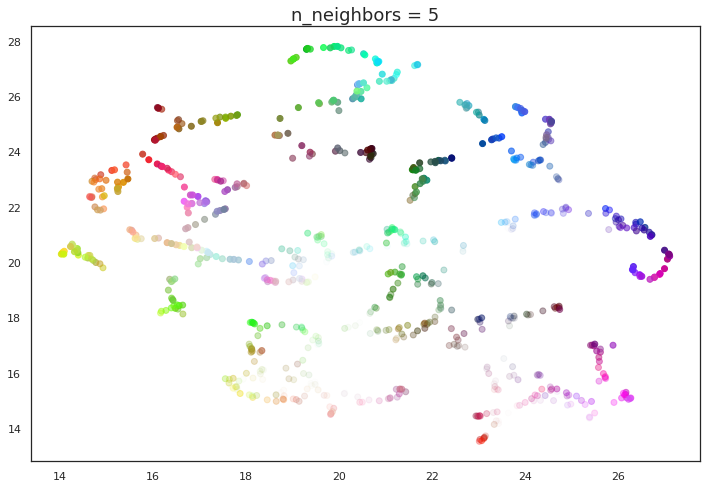

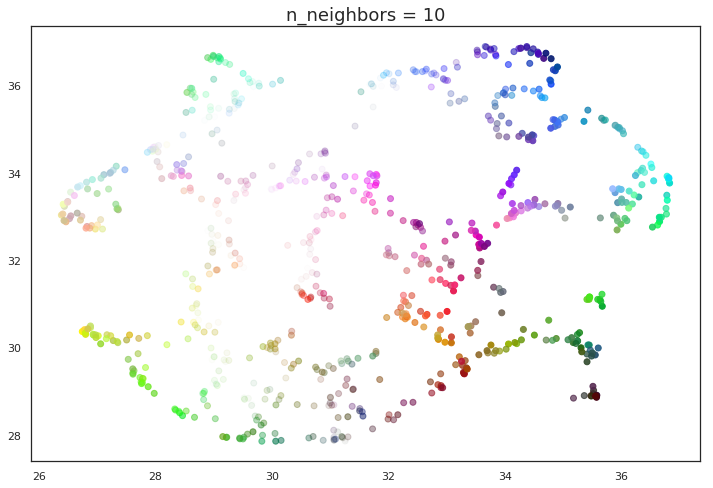

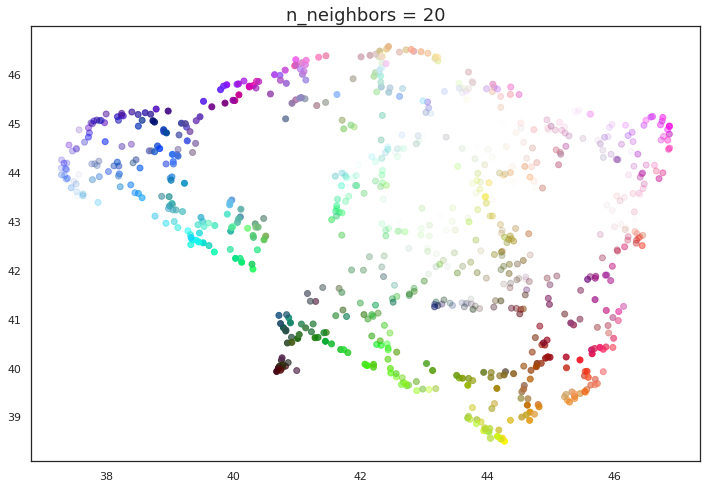

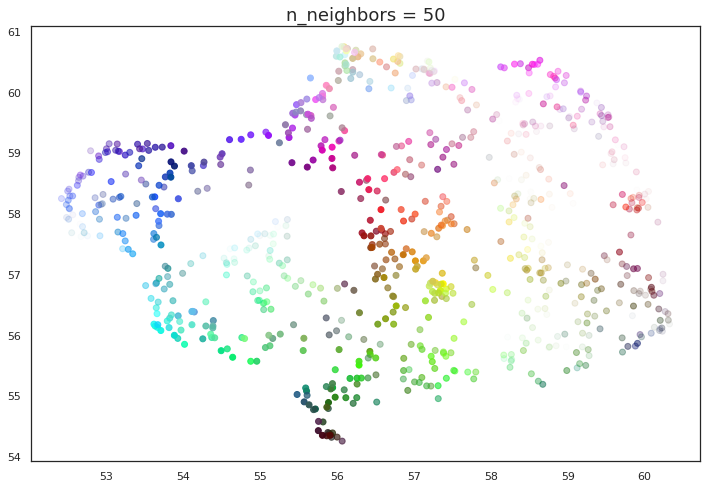

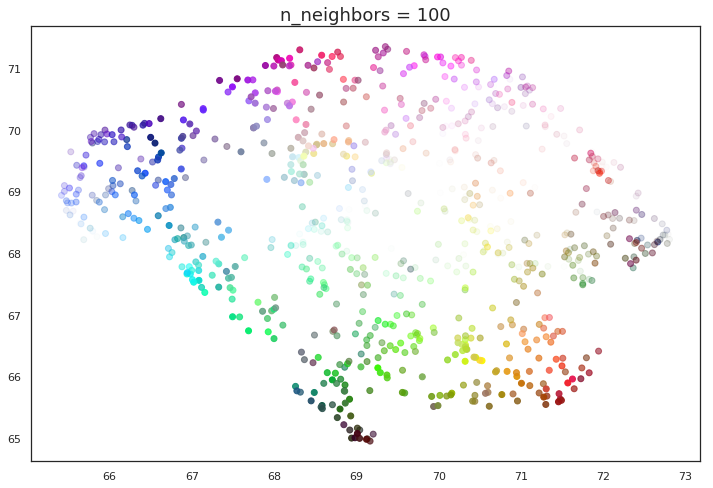

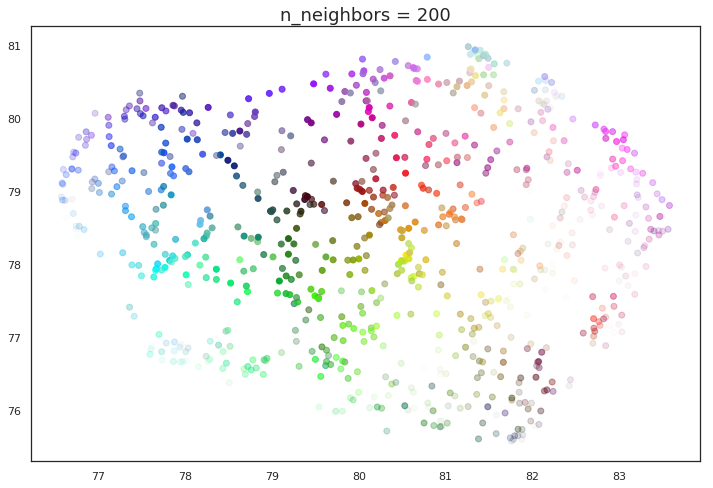

In [95]:
for n in (2, 5, 10, 20, 50, 100, 200):
    draw_umap(n_neighbors=n, title='n_neighbors = {}'.format(n))

With a value of `n_neighbors`=2 we see that `UMAP` merely glues together small chains, but due to the narrow/local view, fails to see how those connect together. It also leaves many different components (and even singleton points). This represents the fact that from a fine detail point of view the data is very disconnected and scattered throughout the space.

As `n_neighbors` is increased `UMAP` manages to see more of the overall structure of the data, gluing more components together, and better coverying the broader structure of the data. By the stage of `n_neighbors`=20 we have a fairly good overall view of the data showing how the various colors interelate to each other over the whole dataset.

As `n_neighbors` increases further more and more focus in placed on the overall structure of the data. This results in, with `n_neighbors`=200 a plot where the overall structure (blues, greens, and reds; high luminance versus low) is well captured, but at the loss of some of the finer local sturcture (individual colors are no longer necessarily immediately near their closest color match).

This effect well exemplifies the local/global tradeoff provided by `n_neighbors`.

### `min_dist`

The `min_dist` parameter controls how tightly `UMAP` is allowed to pack points together. It, quite literally, provides the minimum distance apart that points are allowed to be in the low dimensional representation. This means that low values of `min_dist` will result in clumpier embeddings. This can be useful if you are interested in clustering, or in finer topological structure. Larger values of `min_dist` will prevent `UMAP` from packing point together and will focus instead on the preservation of the broad topological structure instead.

The default value for `min_dist` (as used above) is 0.1. We will look at a range of values from 0.0 through to 0.99.


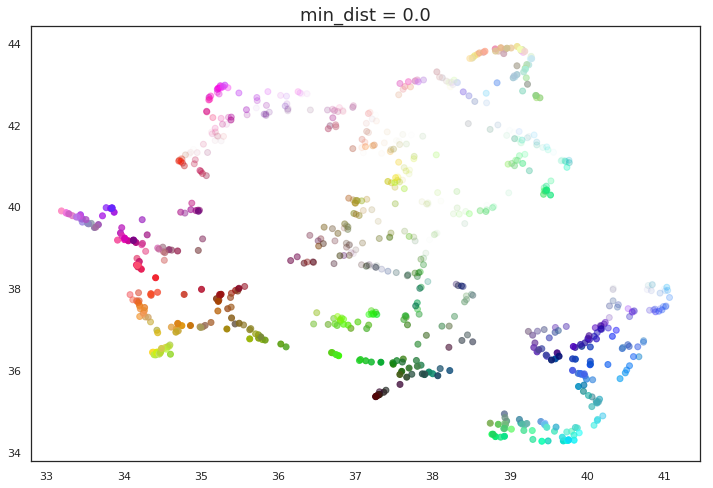

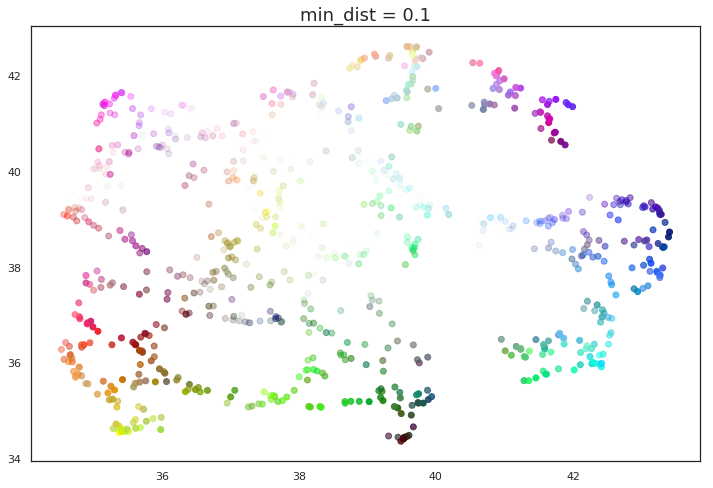

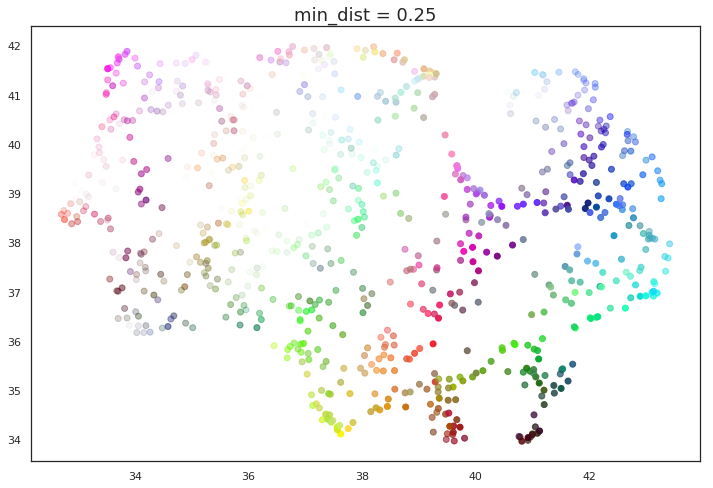

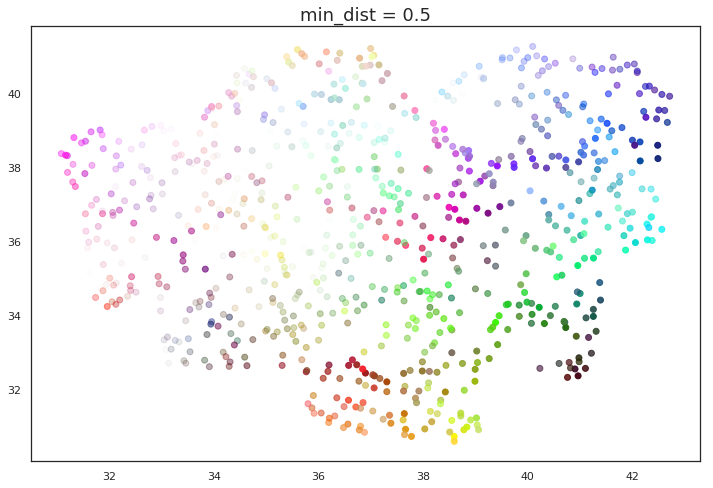

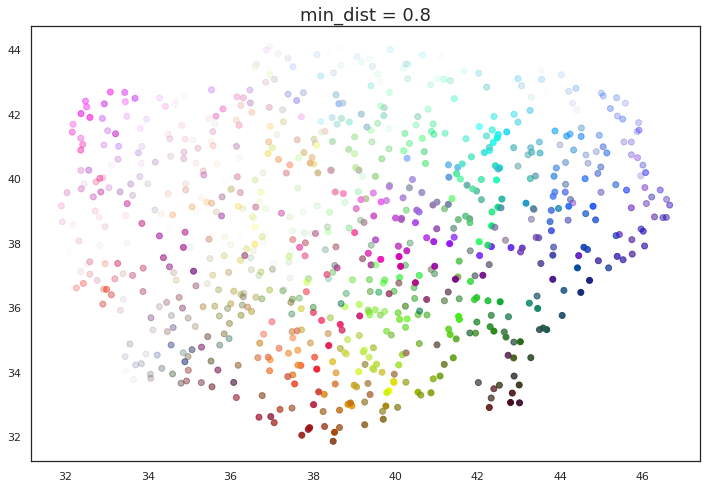

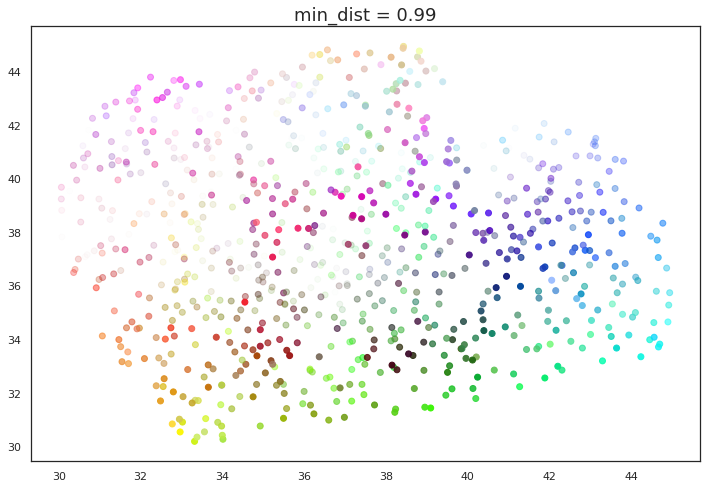

In [96]:
for d in (0.0, 0.1, 0.25, 0.5, 0.8, 0.99):
    draw_umap(min_dist=d, title='min_dist = {}'.format(d))

Here we see that with `min_dist=0.0` `UMAP` manages to find small connected components, clumps and strings in the data, and emphasises these features in the resulting embedding. As `min_dist` is increased these structures are pushed apart into softer more general features, providing a better overarching view of the data at the loss of the more detailed topological structure.

### `n_components`
As is standard for many `scikit-learn` dimension reduction algorithms `UMAP` provides a `n_components` parameter option that allows the user to determine the dimensionality of the reduced dimension space we will be embedding the data into. Unlike some other visualisation algorithms such as `t-SNE` `UMAP` scales well in embedding dimension, so you can use it for more than just visualisation in 2- or 3-dimensions.

For the purposes of this demonstration (so that we can see the effects of the parameter) we will only be looking at 1-dimensional and 3-dimensional embeddings, which we have some hope of visualizing.

First of all we will set `n_components` to 1, forcing `UMAP` to embed the data in a line. For visualisation purposes we will randomly distribute the data on the y-axis to provide some separation between points.

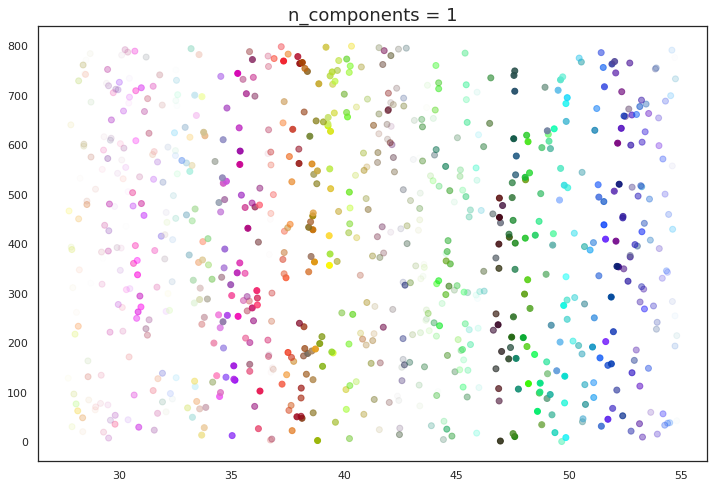

In [97]:
draw_umap(n_components=1, title='n_components = 1')

Now we will try `n_components=3`. For visualisation we will make use of `matplotlib`'s basic 3-dimensional plotting.

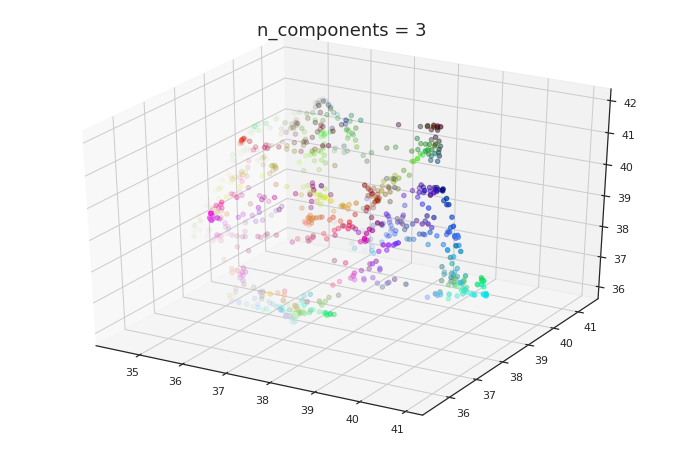

In [98]:
draw_umap(n_components=3, title='n_components = 3')

Here we can see that with more dimensions in which to work UMAP has an easier time separating out the colors in a way that respects the topological structure of the data.

As mentioned, there is really no requirement to stop at `n_components` at 3. If you are interested in (density based) clustering, or other machine learning techniques, it can be beneficial to pick a larger embedding dimension (say 10, or 50) closer to the the dimension of the underlying manifold on which your data lies.

### `metric`
The final UMAP parameter we will be considering in this notebook is the `metric` parameter. This controls how distance is computed in the ambient space of the input data. By default UMAP supports a wide variety of metrics, including:

**Minkowski style metrics**

-  `euclidean`
-  `manhattan`
-  `chebyshev`
-  `minkowski`

**Miscellaneous spatial metrics**

-  `canberra`
-  `braycurtis`
-  `haversine`

**Normalized spatial metrics**

-  `mahalanobis`
-  `wminkowski`
-  `seuclidean`

**Angular and correlation metrics**

-  `cosine`
-  `correlation`

**Metrics for binary data**

-  `hamming`
-  `jaccard`
-  `dice`
-  `russelrao`
-  `kulsinski`
-  `rogerstanimoto`
-  `sokalmichener`
-  `sokalsneath`
-  `yule`

Any of which can be specified by setting `metric='<metric name>'`; for example to use cosine distance as the metric you would use `metric='cosine'`.

UMAP offers more than this however -- it supports custom user defined metrics as long as those metrics can be compiled in `nopython` mode by `numba`. We have collected user defined metrics into a .py module file.

In [99]:
import custom_metrics
from custom_metrics import *

With such custom metrics in hand we can get UMAP to embed the data using those metrics to measure distance between our input data points. Note that `numba` provides significant flexibility in what we can do in defining distance functions. Despite this we retain the high performance we expect from UMAP even using such custom functions.

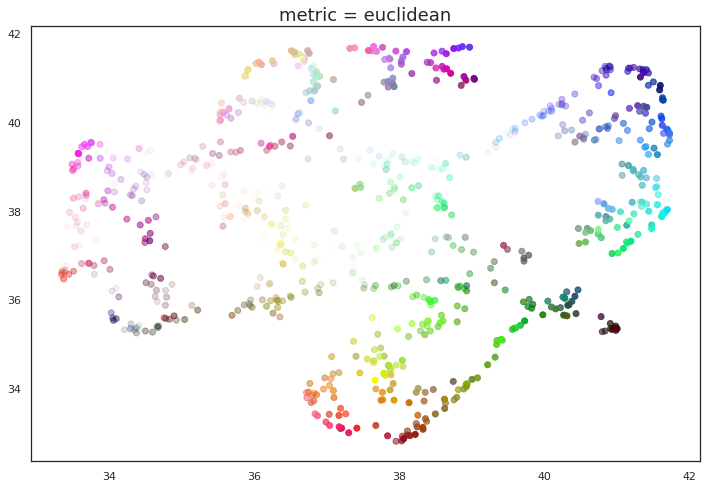

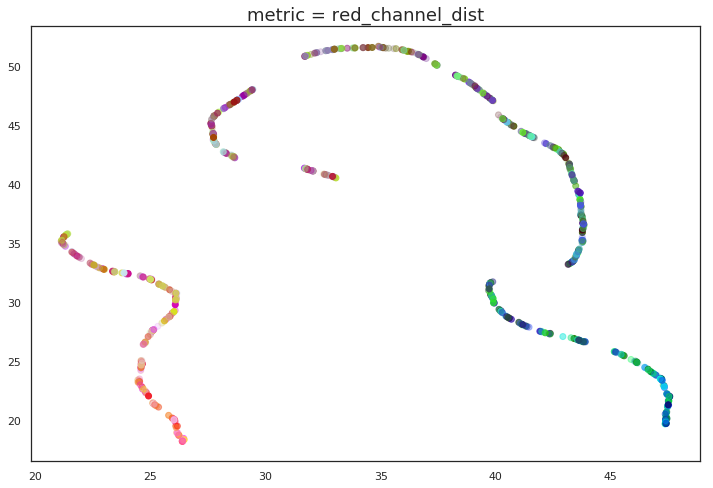

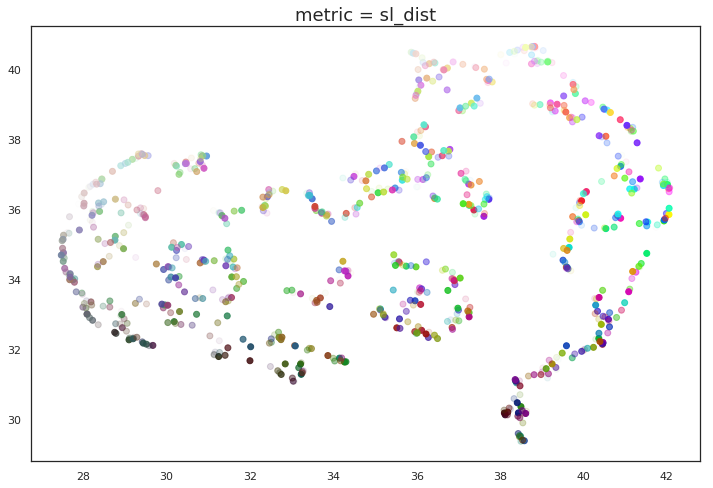

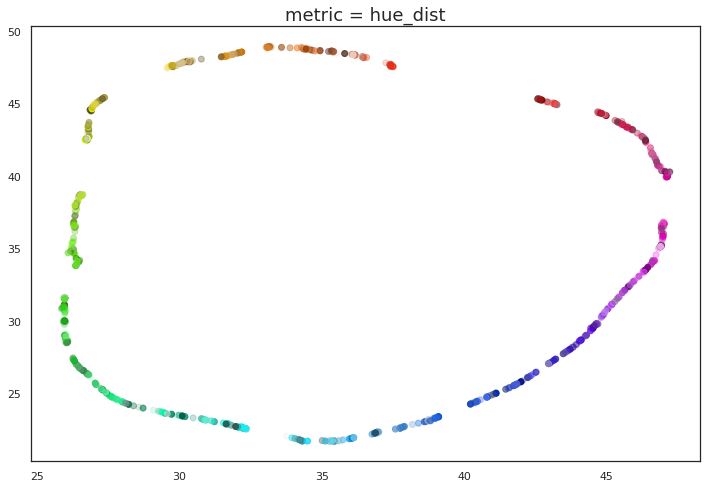

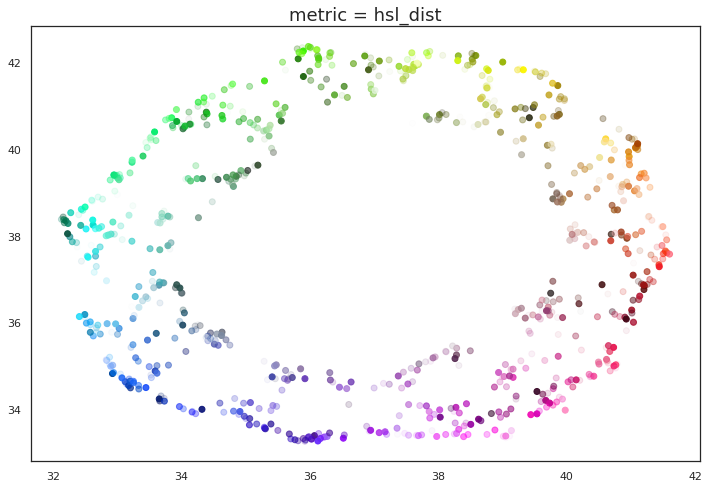

In [100]:
for m in ("euclidean", red_channel_dist, sl_dist, hue_dist, hsl_dist):
    name = m if type(m) is str else m.__name__
    draw_umap(n_components=2, metric=m, title='metric = {}'.format(name))

And here we can see the effects of the metrics quite clearly. The pure red channel correctly see the data as living on a one dimensional manifold, the hue metric interprets the data as living in a circle, and the HSL metric fattens out the circle according to the saturation and lightness. This provides a reasonable demonstration of the power and flexibility of UMAP in understanding the underlying topology of data, and finding a suitable low dimensional representation of that topology.

## UMAP Applications
https://umap-learn.readthedocs.io/en/latest/supervised.html

### dimensional reduction

### pre processing

### metric learning

## UMAP Visualizations

In [101]:
# embed with UMAP
embedding = UMAP(metric='cosine', n_epochs=300).fit_transform(P)

/home/ian/anaconda3/lib/python3.6/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


In [102]:
# save for later
np.savez('1e6_pts.npz', embedding=embedding)

In [103]:
n =400_000

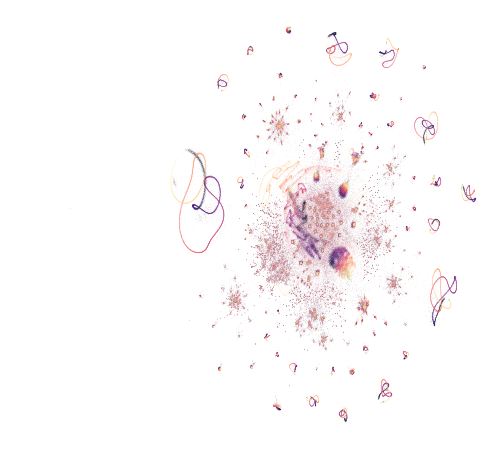

In [104]:
# and save the image
%matplotlib inline
from matplotlib import pyplot as plt
fig = plt.figure(figsize=(8,8))
# fig.patch.set_facecolor('black')
# plt.style.use('dark_background')
plt.scatter(embedding[:,0], embedding[:,1], marker='o', s=0.05, edgecolor='',
            c=np.arange(n), cmap="magma")
plt.axis("off")
plt.savefig("primes_umap_1e6_16k_smaller_pts.png", dpi=2000, facecolor='black')

## Algorithm Comparison

In [105]:
from IPython.display import Javascript
Javascript("Jupyter.notebook.execute_cells([-19])")

<IPython.core.display.Javascript object>

In [106]:
import warnings; warnings.simplefilter('ignore')

### Generators

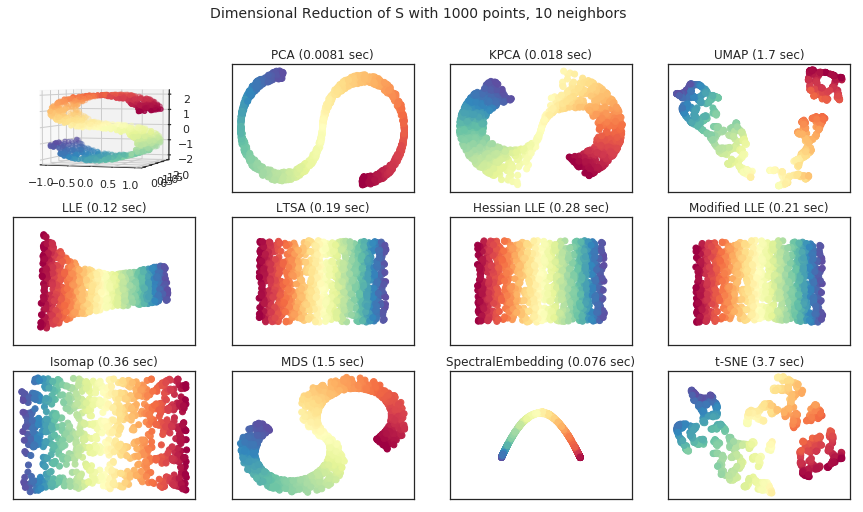

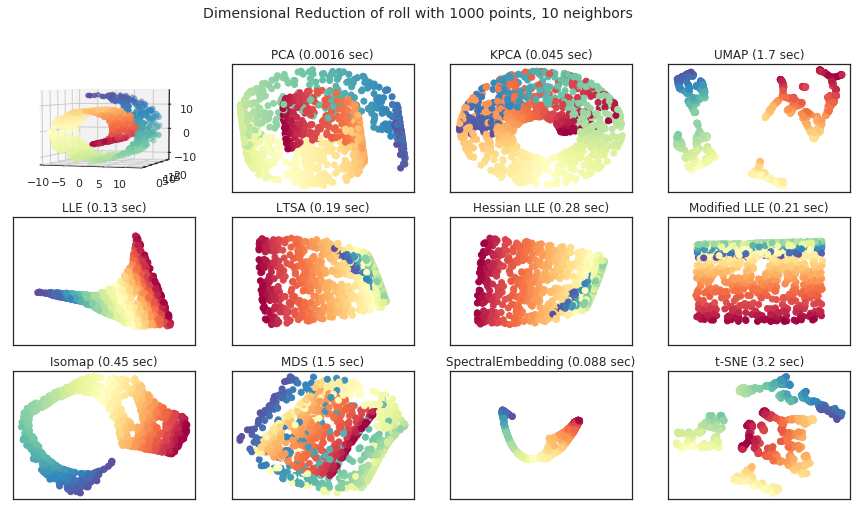

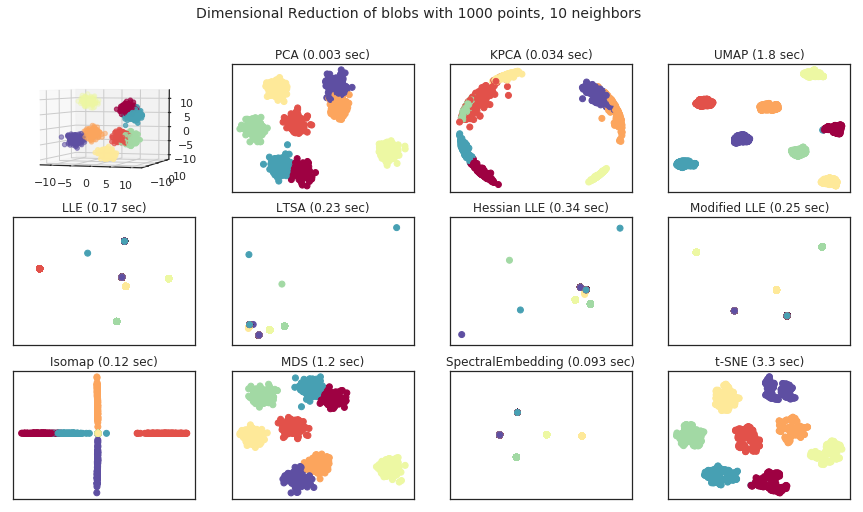

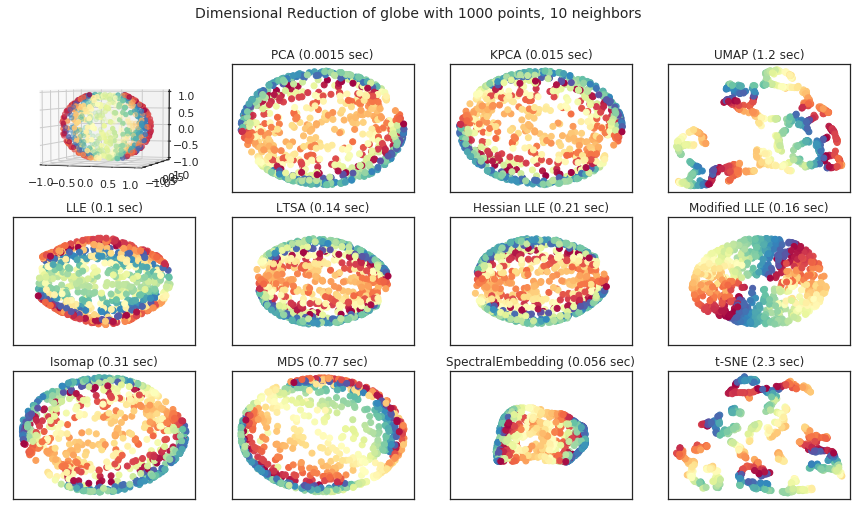

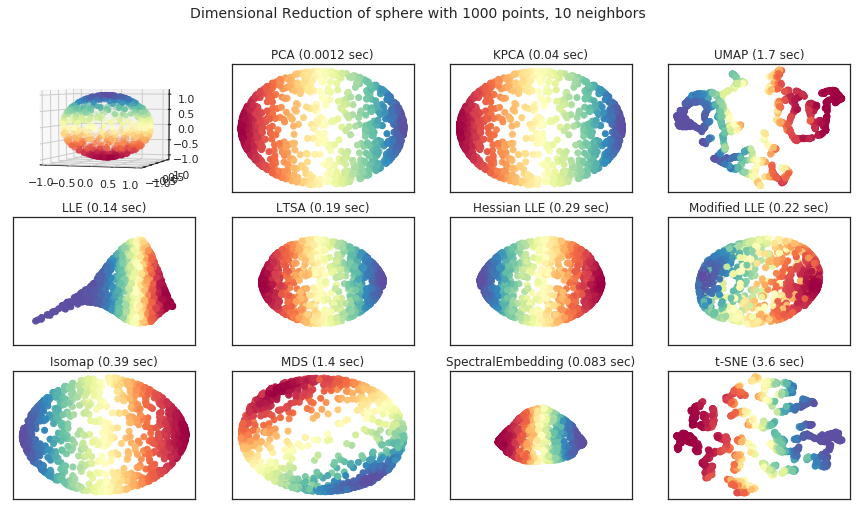

...

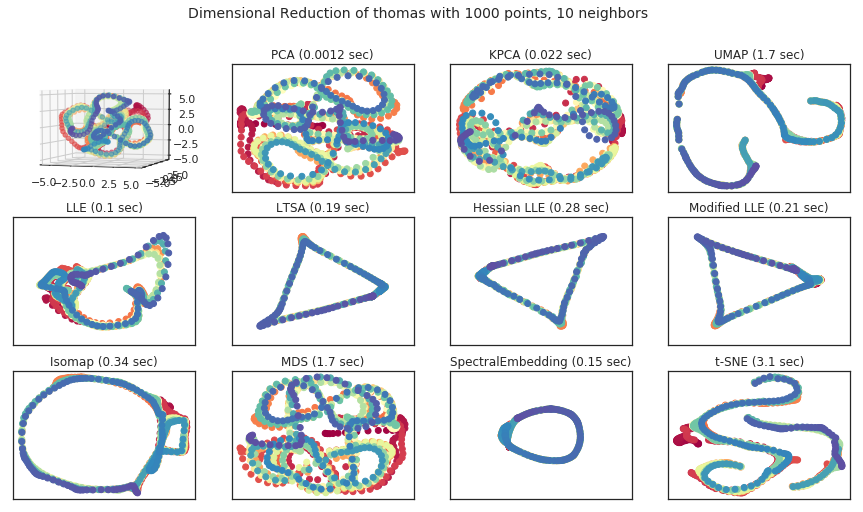

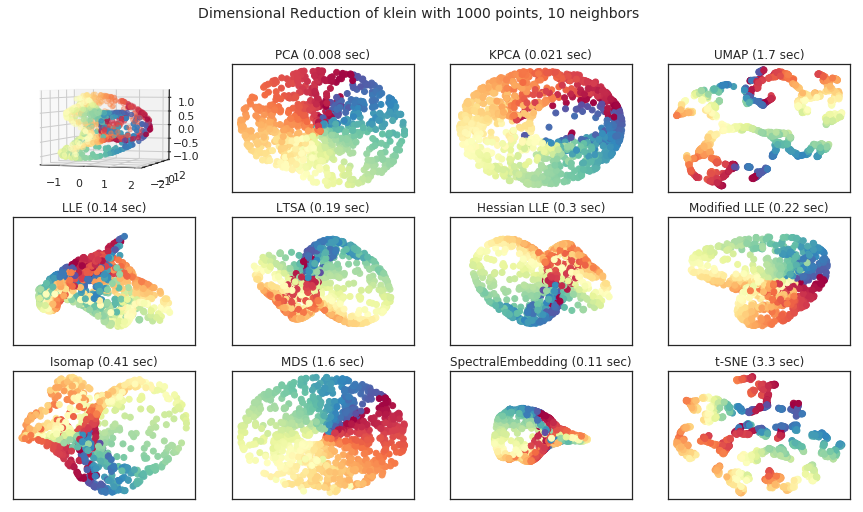

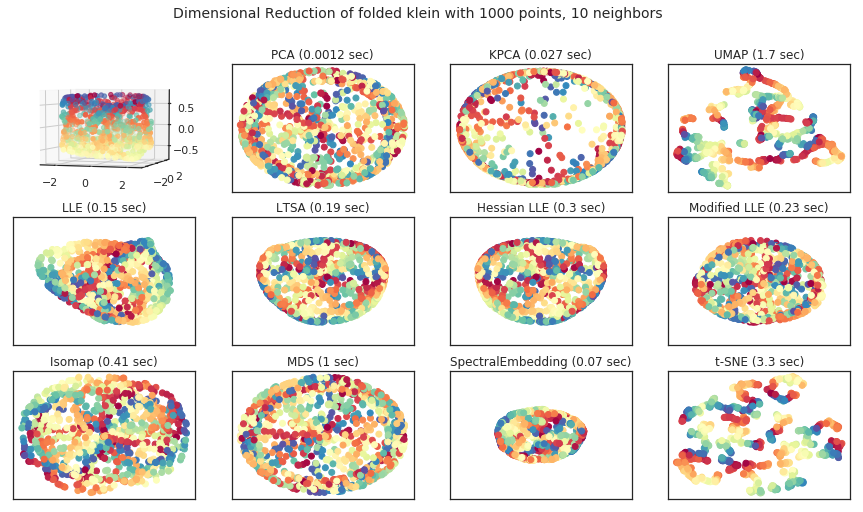

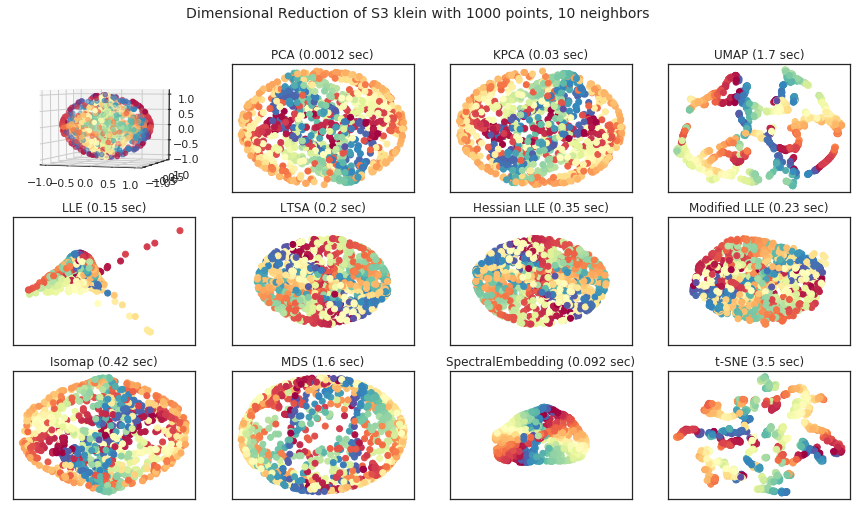

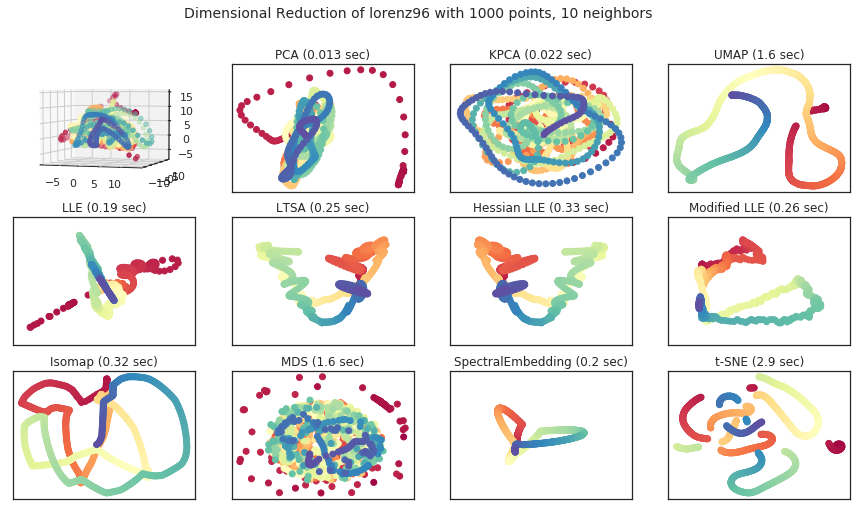

In [109]:
show_example('S')
show_example('roll')
show_example('blobs')
show_example('globe')
show_example('sphere')
show_example('torus')
show_example('S3 torus')
show_example('mobius')
show_example('knot')
show_example('lorenz')
show_example('rossler')
show_example('thomas')
show_example('klein')
show_example('folded klein')
show_example('S3 klein')
show_example('lorenz96')

# Method Comparison Code
This code is remodified from sklearn [sample code](http://scikit-learn.org/stable/auto_examples/manifold/plot_compare_methods.html).

In [108]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import NullFormatter

def plot(data, color, algo, title, subplot):
    t0 = time()
    Y = algo.fit_transform(data)
    t1 = time()
    plt.scatter(Y[:, 0], Y[:, 1], c=color, cmap=plt.cm.Spectral)
    plt.title("%s (%.2g sec)" % (title, t1 - t0))
    subplot.xaxis.set_major_formatter(NullFormatter())
    subplot.yaxis.set_major_formatter(NullFormatter())
    plt.axis('tight')

def show_example(shape='S'):
    # Next line to silence pyflakes. This import is needed.
    Axes3D

    n_points = 1000
    n_neighbors = 10
    n_components = 2
    
    if shape == 'S':
        X, color = ds.make_s_curve(n_points)
    elif shape == 'roll':
        X, color = ds.make_swiss_roll(n_points)
    elif shape == 'blobs':
        X, color = ds.make_blobs(n_points, n_features=3, centers=8)
    elif shape == 'globe':
        X, color = globe(n_points)
    elif shape == 'sphere':
        X, color = sphere(n_points)
    elif shape == 'torus':
        X, color = torus(n_points)
    elif shape == 'S3 torus':
        X, color = S3_torus(n_points)
    elif shape == 'mobius':
        X, color = mobius_strip(n_points)
    elif shape == 'knot':
        X, color = trefoil_knot(n_points)
    elif shape == 'lorenz':
        X, color = lorenz_attractor(n_points)
    elif shape == 'rossler':
        X, color = rossler_attractor(n_points)
    elif shape == 'thomas':
        X, color = thomas_attractor(n_points)
    elif shape == 'klein':
        X, color = klein_bottle(n_points)
    elif shape == 'folded klein':
        X, color = folded_klein_bottle(n_points)
    elif shape == 'S3 klein':
        X, color = S3_klein_bottle(n_points)
    elif shape == 'lorenz96':
        X, color = Lorenz96_attractor(n_points)
        
    
    if shape in ['blobs', 'lorenz', 'rossler']:
        eigen_solver = 'dense'
    else:
        eigen_solver = 'auto'    
    
    algorithms = (
        ("PCA", decomposition.PCA(n_components=n_components)),
        ("KPCA", decomposition.KernelPCA(n_components=n_components, 
                                         kernel='cosine', gamma=10)),
        ("UMAP", UMAP(n_components=n_components, n_neighbors=n_neighbors)),
        ("LLE", manifold.LocallyLinearEmbedding(n_neighbors, n_components,
                                              eigen_solver=eigen_solver,
                                              method='standard')),
        ("LTSA", manifold.LocallyLinearEmbedding(n_neighbors, n_components,
                                              eigen_solver=eigen_solver,
                                              method='ltsa')),
        ("Hessian LLE", manifold.LocallyLinearEmbedding(n_neighbors, n_components,
                                              eigen_solver=eigen_solver,
                                              method='hessian')),
        ("Modified LLE", manifold.LocallyLinearEmbedding(n_neighbors, n_components,
                                              eigen_solver=eigen_solver,
                                              method='modified')),
        ("Isomap", manifold.Isomap(n_neighbors, n_components)),
        ("MDS", manifold.MDS(n_components, max_iter=100, n_init=1)),
        ("SpectralEmbedding", manifold.SpectralEmbedding(
            n_components=n_components, n_neighbors=n_neighbors)),
        ("t-SNE", manifold.TSNE(n_components=n_components, init='pca', 
                                perplexity=n_neighbors, random_state=0))
    )
    
    fig = plt.figure(figsize=(15, 8))
    plt.suptitle("Dimensional Reduction of %s with %i points, %i neighbors"
                 % (shape, 1000, n_neighbors), fontsize=14)
    
    ax = fig.add_subplot(3, 4, 1, projection='3d')
    ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
    ax.view_init(4, -72)
    
    for i, (title, algo) in enumerate(algorithms):
        ax = fig.add_subplot(3, 4, 2+i)
        plot(data=X, color=color, algo=algo, title=title, subplot=ax)
         
    
    plt.show()



## Animating UMAP
Sometimes one of the best ways to see the effects of hyperparameters is simply to [visualise](https://github.com/lmcinnes/umap/blob/master/notebooks/AnimatingUMAP.ipynb) what happens as they change. We can do that in practice with UMAP by simply creating an animation that transitions between embeddings generated with variations of hyperparameters. To do this we'll make use of matplotlib and its animation capabilities. Jake Vanderplas has a [great tutorial](https://jakevdp.github.io/blog/2012/08/18/matplotlib-animation-tutorial/) if you want to know more about creating animations with matplotlib.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
%matplotlib inline
import seaborn as sns
import itertools
sns.set(style='white', rc={'figure.figsize':(14, 12)})

In [ ]:
plt.rcParams['animation.ffmpeg_path'] = '/usr/bin/ffmpeg'

In [ ]:
from sklearn.datasets import load_digits

We should be able to initialize embeddings with the previous frame.

In [ ]:
from umap import UMAP

To try this out we'll needs a reasonably small dataset (so embedding runs don't take too long since we'll be doing a lot of them). For ease of reproducibility for everyone else I'll use the digits dataset from sklearn. If you want to try other datasets just drop them in here -- COIL20 might be interesting, or you might have your own data.

In [ ]:
digits = load_digits()
data = digits.data
data

We need to move the points in between the embeddings given by different parameter values. There are potentially fancy ways to do this (Something using rotatio and reflection to get an initial alignment might be interesting), but we'll use straighforward linear interpolation between the two embeddings. To do this we'll need a simple function that can turn out intermediate embeddings for the in-between frames of the animation.

In [ ]:
def tween(e1, e2, n_frames=20):
    for i in range(5):
        yield e1
    for i in range(n_frames):
        alpha = i / float(n_frames - 1)
        yield (1 - alpha) * e1 + alpha * e2
    for i in range(5):
        yield(e2)
    return

Now that we can fill in intermediate frame we just need to generate all the embeddings. We'll create a function that can take an argument and set of parameter values and then generate all the embeddings including the in-between frames.

In [ ]:
def generate_frame_data(data, arg_name='n_neighbors', arg_list=[3,4,5,7,9,11,15,20,25,30,40,60,100]):
    result = []
    es = []
    for arg in arg_list:
        kwargs = {arg_name:arg}
        if len(es) > 0:
            es.append(UMAP(init=es[-1], negative_sample_rate=3, **kwargs).fit_transform(data))
        else:
            es.append(UMAP(negative_sample_rate=3, **kwargs).fit_transform(data))
        
    for e1, e2 in zip(es[:-1], es[1:]):
        result.extend(list(tween(e1, e2)))
        
    return result

Next we just need to create a function to actually generate the animation given a list of embeddings (one for each frame). This is really just a matter of workign through the details of how matplotlib generates animations -- I would refer you again to Jake's tutorial if you are interested in the detailed mechanics of this.

In [ ]:
def create_animation(frame_data, arg_name='n_neighbors', arg_list=[3,4,5,7,9,11,15,20,25,30,40,60,100]):
    fig = plt.figure()
    all_data = np.vstack(frame_data)
    frame_bounds = (all_data[:, 0].min() * 1.1, 
                    all_data[:, 0].max() * 1.1,
                    all_data[:, 1].min() * 1.1, 
                    all_data[:, 1].max() * 1.1)
    ax = plt.axes(xlim=(frame_bounds[0], frame_bounds[1]), 
                  ylim=(frame_bounds[2], frame_bounds[3]))
    points = plt.scatter(frame_data[0][:, 0], frame_data[0][:, 1], 
                        s=5, c=digits.target, cmap='Spectral', animated=True)
    title = plt.title('', fontsize=24)
    ax.set_xticks([])
    ax.set_yticks([])
    cbar = plt.colorbar(values=np.arange(10), boundaries=np.arange(11)-0.5, ticks=np.arange(10), drawedges=True)
    cbar.ax.yaxis.set_ticklabels(np.arange(10), fontsize=18)

    def init():
        points.set_offsets(frame_data[0])
        title.set_text('UMAP with {}={}'.format(arg_name, arg_list[0]))
        return points,

    def animate(i):
        points.set_offsets(frame_data[i])
        if (i + 15) % 30 == 0:
            title.set_text('UMAP with {}={}'.format(arg_name, arg_list[(i + 15) // 30]))
        return points,

    anim = animation.FuncAnimation(fig, animate, init_func=init, frames=len(frame_data), interval=20, blit=True)
    anim.save('umap_anim-{}.gif'.format(arg_name), fps=30) #writer='imagemagick'

Finally a little bit of glue to make it all go together.

In [ ]:
def animate_param(data, arg_name='n_neighbors', arg_list=[3,4,5,7,9,11,15,20,25,30,40,60,100]):
    frame_data = generate_frame_data(data, arg_name, arg_list)
    create_animation(frame_data, arg_name, arg_list)

Now we can create an animation -- it will get saved as a GIF file in the current directory. You'll also get to see the final frame of the animation displayed in the notebook.

In [ ]:
animate_param(data, 'n_neighbors', [3,4,5,7,10,15,25,50,100,200])
#animate_param(data, 'min_dist', [0.0, 0.01, 0.1, 0.2, 0.4, 0.6, 0.9])
#animate_param(data, 'gamma', [0.1, 0.2, 0.5, 1.0, 2.0, 5.0, 10.0])
#animate_param(data, 'local_connectivity', [0.1, 0.2, 0.5, 1.0, 2.0, 5.0, 10.0])
#animate_param(data, 'bandwidth', [1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0])
#animate_param(data, 'set_op_mix_ratio', np.linspace(0.0, 1.0, 10))